# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

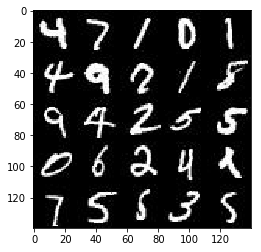

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

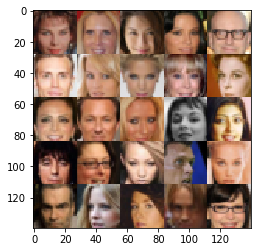

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.4.1
Default GPU Device: /device:GPU:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    inputs_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    learning_rate = tf.placeholder(tf.float32, None, name='learning_rate_input')
    
    return inputs_real, inputs_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):
        alpha=0.2
        # MNIST: 1 color channel
        # CelebA: 3 color channels
        # Input layer is 28x28xcc
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same')
        # Leaky ReLU
        x1 = tf.maximum(alpha * x1, x1)
        # 14x14x64
        
        # Dropout
        # keep_prob = 0.5
        # x1 =  tf.contrib.layers.dropout(x1, keep_prob=keep_prob, is_training=True)
        
        x2 = tf.layers.conv2d(x1, 128, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=True)
        x2 = tf.maximum(alpha * x2, x2)
        # 7x7x128
        
        # Dropout
        # x2 =  tf.contrib.layers.dropout(x2, keep_prob=keep_prob, is_training=True)
        
        x3 = tf.layers.conv2d(x2, 256, 4, strides=1, padding='valid')
        x3 = tf.layers.batch_normalization(x3, training=True)
        x3 = tf.maximum(alpha * x3, x3)
        # 4x4x256
        
        # Dropout
        # x3 =  tf.contrib.layers.dropout(x3, keep_prob=keep_prob, is_training=True)

        # Flatten it
        flat = tf.reshape(x3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        # Sigmoid output
        out = tf.sigmoid(logits)
        
        return out, logits

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    reuse = not is_train
    with tf.variable_scope('generator', reuse=reuse):
        alpha=0.2
        # First fully connected layer
        x1 = tf.layers.dense(z, 4*4*512)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 4, 4, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        # 4x4x512 now
        
        # Dropout
        # keep_prob = 0.5
        # x1 =  tf.contrib.layers.dropout(x1, keep_prob=keep_prob, is_training=is_train)
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 4, strides=1, padding='valid')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        # 7x7x256 now
        
         # Dropout
        # x2 =  tf.contrib.layers.dropout(x2, keep_prob=keep_prob, is_training=is_train)
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)
        # 14x14x128 now
        
         # Dropout
        # x3 =  tf.contrib.layers.dropout(x3, keep_prob=keep_prob, is_training=is_train)
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=2, padding='same')
        # 28x28x3 now
        
        out = tf.tanh(logits)
        
        return out

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    steps = 0
    
    # Init the GAN
    # tf.reset_default_graph()
    nb_examples, width, height, image_channels = data_shape
    input_real, input_z, learning_rate_input = model_inputs(width, height, image_channels, z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, image_channels)    
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))

                # Run optimizers
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z, learning_rate_input: learning_rate})
                _ = sess.run(g_opt, feed_dict={input_z: batch_z, input_real: batch_images, learning_rate_input: learning_rate})

                if steps % 10 == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))

                if steps % 100 == 0:
                    show_generator_output(sess, 72, input_z, image_channels, data_image_mode)
                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 1.0422... Generator Loss: 0.5946
Epoch 1/2... Discriminator Loss: 0.9804... Generator Loss: 0.6482
Epoch 1/2... Discriminator Loss: 0.3143... Generator Loss: 1.6151
Epoch 1/2... Discriminator Loss: 0.2425... Generator Loss: 2.0332
Epoch 1/2... Discriminator Loss: 0.1089... Generator Loss: 2.8068
Epoch 1/2... Discriminator Loss: 1.9866... Generator Loss: 0.1845
Epoch 1/2... Discriminator Loss: 0.4190... Generator Loss: 1.9628
Epoch 1/2... Discriminator Loss: 0.3913... Generator Loss: 1.4865
Epoch 1/2... Discriminator Loss: 0.7083... Generator Loss: 3.8900
Epoch 1/2... Discriminator Loss: 0.1563... Generator Loss: 2.6483


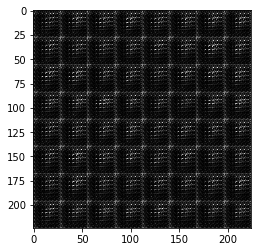

Epoch 1/2... Discriminator Loss: 0.2117... Generator Loss: 3.0186
Epoch 1/2... Discriminator Loss: 0.1185... Generator Loss: 3.1706
Epoch 1/2... Discriminator Loss: 0.2979... Generator Loss: 1.8383
Epoch 1/2... Discriminator Loss: 0.2373... Generator Loss: 2.3358
Epoch 1/2... Discriminator Loss: 0.1772... Generator Loss: 5.6449
Epoch 1/2... Discriminator Loss: 0.2282... Generator Loss: 2.7599
Epoch 1/2... Discriminator Loss: 0.1368... Generator Loss: 3.2514
Epoch 1/2... Discriminator Loss: 0.1359... Generator Loss: 2.8862
Epoch 1/2... Discriminator Loss: 0.1512... Generator Loss: 3.0193
Epoch 1/2... Discriminator Loss: 0.8990... Generator Loss: 0.9160


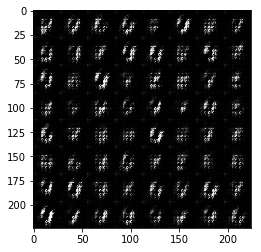

Epoch 1/2... Discriminator Loss: 0.8035... Generator Loss: 0.8670
Epoch 1/2... Discriminator Loss: 0.2973... Generator Loss: 3.0850
Epoch 1/2... Discriminator Loss: 0.1889... Generator Loss: 2.7062
Epoch 1/2... Discriminator Loss: 0.2104... Generator Loss: 2.3034
Epoch 1/2... Discriminator Loss: 0.2143... Generator Loss: 3.9211
Epoch 1/2... Discriminator Loss: 0.1769... Generator Loss: 2.8488
Epoch 1/2... Discriminator Loss: 0.1465... Generator Loss: 2.9434
Epoch 1/2... Discriminator Loss: 0.1259... Generator Loss: 3.1504
Epoch 1/2... Discriminator Loss: 0.2732... Generator Loss: 1.7037
Epoch 1/2... Discriminator Loss: 0.1073... Generator Loss: 3.1886


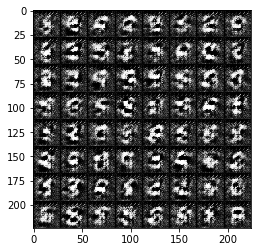

Epoch 1/2... Discriminator Loss: 0.1782... Generator Loss: 2.6869
Epoch 1/2... Discriminator Loss: 0.2785... Generator Loss: 3.3416
Epoch 1/2... Discriminator Loss: 0.1924... Generator Loss: 2.6416
Epoch 1/2... Discriminator Loss: 0.2085... Generator Loss: 2.2703
Epoch 1/2... Discriminator Loss: 1.5754... Generator Loss: 0.4355
Epoch 1/2... Discriminator Loss: 0.9084... Generator Loss: 8.1442
Epoch 1/2... Discriminator Loss: 1.0925... Generator Loss: 1.1033
Epoch 1/2... Discriminator Loss: 0.1301... Generator Loss: 3.6885
Epoch 1/2... Discriminator Loss: 0.1646... Generator Loss: 4.1661
Epoch 1/2... Discriminator Loss: 0.7465... Generator Loss: 0.9285


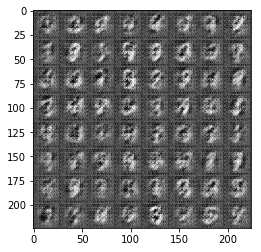

Epoch 1/2... Discriminator Loss: 0.5495... Generator Loss: 1.2747
Epoch 1/2... Discriminator Loss: 0.7529... Generator Loss: 3.8246
Epoch 1/2... Discriminator Loss: 0.7589... Generator Loss: 1.5682
Epoch 1/2... Discriminator Loss: 0.7346... Generator Loss: 0.8948
Epoch 1/2... Discriminator Loss: 0.3847... Generator Loss: 1.8135
Epoch 1/2... Discriminator Loss: 0.2573... Generator Loss: 1.8525
Epoch 1/2... Discriminator Loss: 0.4571... Generator Loss: 1.4060
Epoch 1/2... Discriminator Loss: 0.4170... Generator Loss: 1.4501
Epoch 1/2... Discriminator Loss: 0.2916... Generator Loss: 1.8522
Epoch 1/2... Discriminator Loss: 0.3527... Generator Loss: 1.5467


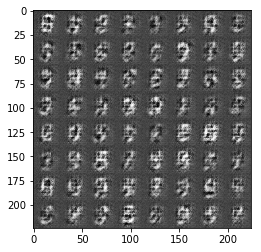

Epoch 1/2... Discriminator Loss: 0.3763... Generator Loss: 2.2335
Epoch 1/2... Discriminator Loss: 0.3654... Generator Loss: 1.5693
Epoch 1/2... Discriminator Loss: 0.2805... Generator Loss: 2.4432
Epoch 1/2... Discriminator Loss: 0.2712... Generator Loss: 1.7252
Epoch 1/2... Discriminator Loss: 0.2154... Generator Loss: 2.4157
Epoch 1/2... Discriminator Loss: 0.1734... Generator Loss: 3.0306
Epoch 1/2... Discriminator Loss: 0.2818... Generator Loss: 1.7844
Epoch 1/2... Discriminator Loss: 0.1017... Generator Loss: 3.7095
Epoch 1/2... Discriminator Loss: 0.2331... Generator Loss: 1.9640
Epoch 1/2... Discriminator Loss: 0.3026... Generator Loss: 1.8237


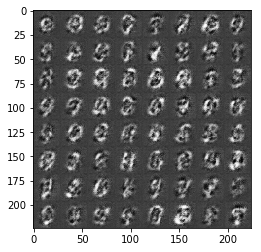

Epoch 1/2... Discriminator Loss: 0.4081... Generator Loss: 1.3826
Epoch 1/2... Discriminator Loss: 0.1383... Generator Loss: 2.7086
Epoch 1/2... Discriminator Loss: 0.2998... Generator Loss: 1.6560
Epoch 1/2... Discriminator Loss: 0.1936... Generator Loss: 2.3715
Epoch 1/2... Discriminator Loss: 0.2275... Generator Loss: 2.0805
Epoch 1/2... Discriminator Loss: 0.1685... Generator Loss: 2.3618
Epoch 1/2... Discriminator Loss: 0.2890... Generator Loss: 1.6823
Epoch 1/2... Discriminator Loss: 0.4858... Generator Loss: 1.1534
Epoch 1/2... Discriminator Loss: 0.1041... Generator Loss: 2.6423
Epoch 1/2... Discriminator Loss: 0.0746... Generator Loss: 3.4647


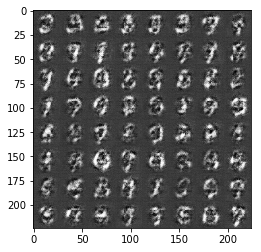

Epoch 1/2... Discriminator Loss: 0.1713... Generator Loss: 2.3652
Epoch 1/2... Discriminator Loss: 0.0784... Generator Loss: 3.4757
Epoch 1/2... Discriminator Loss: 0.3993... Generator Loss: 1.3248
Epoch 1/2... Discriminator Loss: 0.0506... Generator Loss: 4.8163
Epoch 1/2... Discriminator Loss: 0.5061... Generator Loss: 1.2658
Epoch 1/2... Discriminator Loss: 0.2567... Generator Loss: 1.7250
Epoch 1/2... Discriminator Loss: 0.1559... Generator Loss: 2.2920
Epoch 1/2... Discriminator Loss: 0.0804... Generator Loss: 3.3240
Epoch 1/2... Discriminator Loss: 0.1875... Generator Loss: 2.0067
Epoch 1/2... Discriminator Loss: 0.0354... Generator Loss: 4.2440


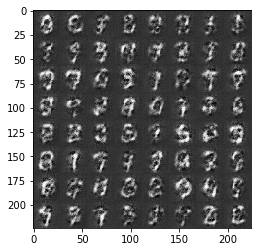

Epoch 1/2... Discriminator Loss: 0.0950... Generator Loss: 2.9029
Epoch 1/2... Discriminator Loss: 0.1913... Generator Loss: 2.0284
Epoch 1/2... Discriminator Loss: 0.0316... Generator Loss: 4.2033
Epoch 1/2... Discriminator Loss: 0.0358... Generator Loss: 4.7694
Epoch 1/2... Discriminator Loss: 0.1339... Generator Loss: 2.8822
Epoch 1/2... Discriminator Loss: 0.0913... Generator Loss: 2.9592
Epoch 1/2... Discriminator Loss: 0.2396... Generator Loss: 1.8305
Epoch 1/2... Discriminator Loss: 0.5474... Generator Loss: 1.3477
Epoch 1/2... Discriminator Loss: 0.7425... Generator Loss: 1.4214
Epoch 1/2... Discriminator Loss: 0.8572... Generator Loss: 0.6986


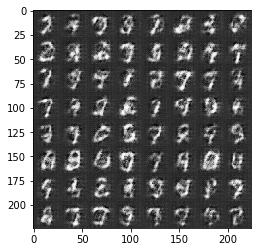

Epoch 1/2... Discriminator Loss: 0.3141... Generator Loss: 1.9044
Epoch 1/2... Discriminator Loss: 0.2933... Generator Loss: 2.1459
Epoch 1/2... Discriminator Loss: 0.2317... Generator Loss: 1.8949
Epoch 1/2... Discriminator Loss: 0.3091... Generator Loss: 1.5569
Epoch 1/2... Discriminator Loss: 0.2575... Generator Loss: 1.6941
Epoch 1/2... Discriminator Loss: 0.2016... Generator Loss: 1.9712
Epoch 1/2... Discriminator Loss: 0.1818... Generator Loss: 2.1630
Epoch 1/2... Discriminator Loss: 0.0809... Generator Loss: 3.1729
Epoch 1/2... Discriminator Loss: 0.0942... Generator Loss: 3.0844
Epoch 1/2... Discriminator Loss: 0.0999... Generator Loss: 2.7649


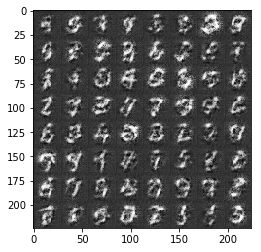

Epoch 1/2... Discriminator Loss: 0.1093... Generator Loss: 2.8692
Epoch 1/2... Discriminator Loss: 0.1032... Generator Loss: 2.7585
Epoch 1/2... Discriminator Loss: 0.2708... Generator Loss: 1.7403
Epoch 1/2... Discriminator Loss: 0.1512... Generator Loss: 2.2322
Epoch 1/2... Discriminator Loss: 0.1455... Generator Loss: 2.3737
Epoch 1/2... Discriminator Loss: 0.1971... Generator Loss: 1.9120
Epoch 1/2... Discriminator Loss: 0.1634... Generator Loss: 2.2854
Epoch 1/2... Discriminator Loss: 0.0327... Generator Loss: 4.5184
Epoch 1/2... Discriminator Loss: 0.0721... Generator Loss: 3.2646
Epoch 1/2... Discriminator Loss: 0.1255... Generator Loss: 2.6122


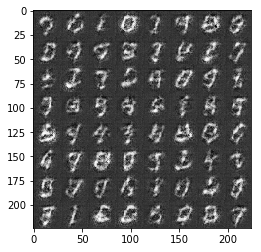

Epoch 1/2... Discriminator Loss: 0.0633... Generator Loss: 3.2257
Epoch 1/2... Discriminator Loss: 0.1335... Generator Loss: 2.4222
Epoch 1/2... Discriminator Loss: 0.1490... Generator Loss: 2.3105
Epoch 1/2... Discriminator Loss: 0.0592... Generator Loss: 3.4090
Epoch 1/2... Discriminator Loss: 0.1656... Generator Loss: 2.2274
Epoch 1/2... Discriminator Loss: 0.0979... Generator Loss: 2.7579
Epoch 1/2... Discriminator Loss: 0.0379... Generator Loss: 3.9324
Epoch 1/2... Discriminator Loss: 0.1168... Generator Loss: 2.6988
Epoch 1/2... Discriminator Loss: 0.0859... Generator Loss: 3.1242
Epoch 1/2... Discriminator Loss: 0.0933... Generator Loss: 2.9532


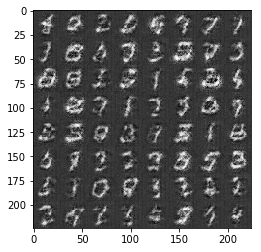

Epoch 1/2... Discriminator Loss: 0.0283... Generator Loss: 4.2394
Epoch 1/2... Discriminator Loss: 0.1089... Generator Loss: 2.8166
Epoch 1/2... Discriminator Loss: 0.0643... Generator Loss: 3.4075
Epoch 1/2... Discriminator Loss: 0.0263... Generator Loss: 4.5844
Epoch 1/2... Discriminator Loss: 0.0902... Generator Loss: 2.9648
Epoch 1/2... Discriminator Loss: 0.0787... Generator Loss: 3.1030
Epoch 1/2... Discriminator Loss: 1.2462... Generator Loss: 0.4203
Epoch 1/2... Discriminator Loss: 0.1098... Generator Loss: 2.6755
Epoch 1/2... Discriminator Loss: 0.1732... Generator Loss: 2.3033
Epoch 1/2... Discriminator Loss: 0.0599... Generator Loss: 3.5587


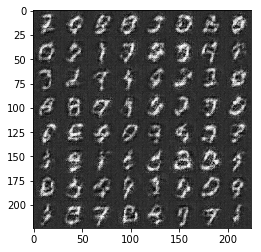

Epoch 1/2... Discriminator Loss: 0.0409... Generator Loss: 3.9557
Epoch 1/2... Discriminator Loss: 0.0830... Generator Loss: 2.9710
Epoch 1/2... Discriminator Loss: 0.0300... Generator Loss: 4.1934
Epoch 1/2... Discriminator Loss: 0.0485... Generator Loss: 3.6465
Epoch 1/2... Discriminator Loss: 0.0607... Generator Loss: 3.2410
Epoch 1/2... Discriminator Loss: 0.1900... Generator Loss: 2.0921
Epoch 1/2... Discriminator Loss: 0.1166... Generator Loss: 2.6544
Epoch 1/2... Discriminator Loss: 0.0205... Generator Loss: 4.3383
Epoch 1/2... Discriminator Loss: 0.0340... Generator Loss: 4.3102
Epoch 1/2... Discriminator Loss: 0.0443... Generator Loss: 3.9707


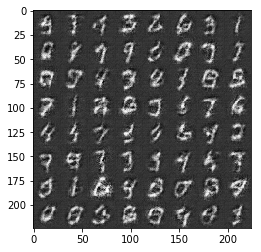

Epoch 1/2... Discriminator Loss: 0.1381... Generator Loss: 2.3529
Epoch 1/2... Discriminator Loss: 0.5670... Generator Loss: 1.0541
Epoch 1/2... Discriminator Loss: 1.9567... Generator Loss: 1.1171
Epoch 1/2... Discriminator Loss: 0.9986... Generator Loss: 1.1391
Epoch 1/2... Discriminator Loss: 0.6820... Generator Loss: 1.5342
Epoch 1/2... Discriminator Loss: 0.9566... Generator Loss: 0.8233
Epoch 1/2... Discriminator Loss: 0.8114... Generator Loss: 2.1732
Epoch 1/2... Discriminator Loss: 0.7626... Generator Loss: 1.0414
Epoch 1/2... Discriminator Loss: 0.5010... Generator Loss: 1.5304
Epoch 1/2... Discriminator Loss: 0.5481... Generator Loss: 1.8471


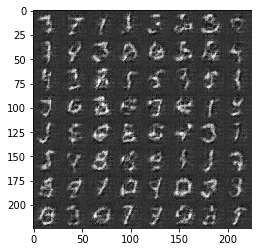

Epoch 1/2... Discriminator Loss: 0.5917... Generator Loss: 2.3889
Epoch 1/2... Discriminator Loss: 0.4117... Generator Loss: 1.9775
Epoch 1/2... Discriminator Loss: 0.4735... Generator Loss: 1.8604
Epoch 1/2... Discriminator Loss: 0.5796... Generator Loss: 3.5864
Epoch 1/2... Discriminator Loss: 0.3567... Generator Loss: 3.0059
Epoch 1/2... Discriminator Loss: 0.5566... Generator Loss: 1.1081
Epoch 1/2... Discriminator Loss: 0.3526... Generator Loss: 1.4574
Epoch 1/2... Discriminator Loss: 0.2719... Generator Loss: 1.9477
Epoch 1/2... Discriminator Loss: 0.2374... Generator Loss: 3.1066
Epoch 1/2... Discriminator Loss: 0.7418... Generator Loss: 1.0407


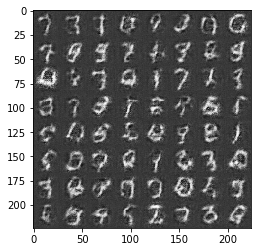

Epoch 1/2... Discriminator Loss: 0.2288... Generator Loss: 2.0703
Epoch 1/2... Discriminator Loss: 0.2892... Generator Loss: 3.1183
Epoch 1/2... Discriminator Loss: 0.4445... Generator Loss: 1.2929
Epoch 1/2... Discriminator Loss: 0.2898... Generator Loss: 1.8693
Epoch 1/2... Discriminator Loss: 0.2145... Generator Loss: 1.8992
Epoch 1/2... Discriminator Loss: 0.1728... Generator Loss: 2.3530
Epoch 1/2... Discriminator Loss: 0.1290... Generator Loss: 2.6001
Epoch 1/2... Discriminator Loss: 0.3410... Generator Loss: 1.4893
Epoch 1/2... Discriminator Loss: 0.5819... Generator Loss: 1.1697
Epoch 1/2... Discriminator Loss: 0.1916... Generator Loss: 2.3625


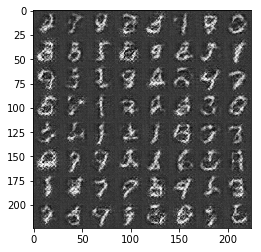

Epoch 1/2... Discriminator Loss: 0.1698... Generator Loss: 2.1518
Epoch 1/2... Discriminator Loss: 0.1439... Generator Loss: 2.6701
Epoch 1/2... Discriminator Loss: 0.2052... Generator Loss: 2.0296
Epoch 1/2... Discriminator Loss: 0.1279... Generator Loss: 2.5821
Epoch 1/2... Discriminator Loss: 0.0774... Generator Loss: 3.3378
Epoch 1/2... Discriminator Loss: 0.1891... Generator Loss: 2.2202
Epoch 1/2... Discriminator Loss: 0.1909... Generator Loss: 2.0877
Epoch 1/2... Discriminator Loss: 0.1245... Generator Loss: 2.5749
Epoch 1/2... Discriminator Loss: 0.1242... Generator Loss: 2.5406
Epoch 1/2... Discriminator Loss: 0.0632... Generator Loss: 3.5104


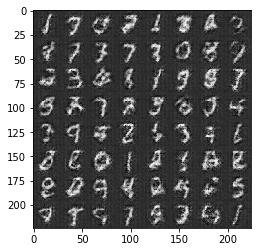

Epoch 1/2... Discriminator Loss: 0.2176... Generator Loss: 1.9900
Epoch 1/2... Discriminator Loss: 0.1666... Generator Loss: 2.2576
Epoch 1/2... Discriminator Loss: 0.0960... Generator Loss: 2.8349
Epoch 1/2... Discriminator Loss: 0.0829... Generator Loss: 2.9804
Epoch 1/2... Discriminator Loss: 0.0333... Generator Loss: 4.8149
Epoch 1/2... Discriminator Loss: 0.0891... Generator Loss: 3.0542
Epoch 1/2... Discriminator Loss: 0.2258... Generator Loss: 1.9997
Epoch 2/2... Discriminator Loss: 0.1685... Generator Loss: 2.2193
Epoch 2/2... Discriminator Loss: 0.0362... Generator Loss: 4.1761
Epoch 2/2... Discriminator Loss: 0.0359... Generator Loss: 4.3926


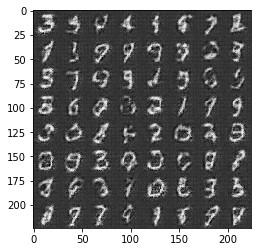

Epoch 2/2... Discriminator Loss: 0.1009... Generator Loss: 2.7466
Epoch 2/2... Discriminator Loss: 0.8550... Generator Loss: 0.9452
Epoch 2/2... Discriminator Loss: 0.6611... Generator Loss: 1.4663
Epoch 2/2... Discriminator Loss: 1.0805... Generator Loss: 2.8456
Epoch 2/2... Discriminator Loss: 0.6067... Generator Loss: 1.1760
Epoch 2/2... Discriminator Loss: 0.3473... Generator Loss: 1.7260
Epoch 2/2... Discriminator Loss: 0.9484... Generator Loss: 0.6956
Epoch 2/2... Discriminator Loss: 0.2187... Generator Loss: 2.3771
Epoch 2/2... Discriminator Loss: 0.2980... Generator Loss: 1.9416
Epoch 2/2... Discriminator Loss: 0.1207... Generator Loss: 2.7239


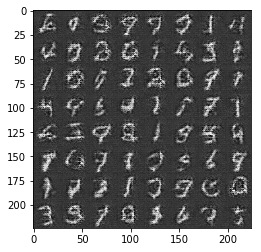

Epoch 2/2... Discriminator Loss: 0.2014... Generator Loss: 2.2036
Epoch 2/2... Discriminator Loss: 0.1940... Generator Loss: 2.3496
Epoch 2/2... Discriminator Loss: 0.2242... Generator Loss: 2.0731
Epoch 2/2... Discriminator Loss: 0.1300... Generator Loss: 2.6982
Epoch 2/2... Discriminator Loss: 0.2036... Generator Loss: 1.9867
Epoch 2/2... Discriminator Loss: 0.1357... Generator Loss: 2.5954
Epoch 2/2... Discriminator Loss: 0.0667... Generator Loss: 3.4117
Epoch 2/2... Discriminator Loss: 0.0537... Generator Loss: 3.5553
Epoch 2/2... Discriminator Loss: 0.0595... Generator Loss: 3.4447
Epoch 2/2... Discriminator Loss: 0.0446... Generator Loss: 4.0910


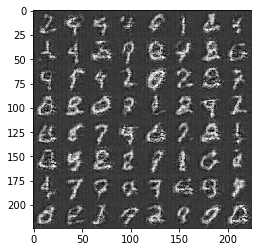

Epoch 2/2... Discriminator Loss: 0.0451... Generator Loss: 4.0004
Epoch 2/2... Discriminator Loss: 0.1199... Generator Loss: 2.6046
Epoch 2/2... Discriminator Loss: 0.0835... Generator Loss: 3.0330
Epoch 2/2... Discriminator Loss: 0.0245... Generator Loss: 5.0128
Epoch 2/2... Discriminator Loss: 0.0616... Generator Loss: 3.4045
Epoch 2/2... Discriminator Loss: 0.0691... Generator Loss: 3.5580
Epoch 2/2... Discriminator Loss: 0.0427... Generator Loss: 4.4369
Epoch 2/2... Discriminator Loss: 0.1137... Generator Loss: 2.8692
Epoch 2/2... Discriminator Loss: 0.1815... Generator Loss: 2.1453
Epoch 2/2... Discriminator Loss: 0.0261... Generator Loss: 4.9967


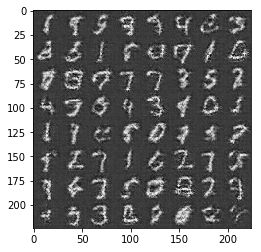

Epoch 2/2... Discriminator Loss: 0.1270... Generator Loss: 2.4512
Epoch 2/2... Discriminator Loss: 0.0651... Generator Loss: 3.3717
Epoch 2/2... Discriminator Loss: 0.0967... Generator Loss: 2.9450
Epoch 2/2... Discriminator Loss: 0.2108... Generator Loss: 1.9725
Epoch 2/2... Discriminator Loss: 0.0315... Generator Loss: 4.2008
Epoch 2/2... Discriminator Loss: 0.0346... Generator Loss: 4.2463
Epoch 2/2... Discriminator Loss: 0.0767... Generator Loss: 2.9421
Epoch 2/2... Discriminator Loss: 0.0432... Generator Loss: 3.9062
Epoch 2/2... Discriminator Loss: 0.0150... Generator Loss: 5.8001
Epoch 2/2... Discriminator Loss: 0.0364... Generator Loss: 3.8904


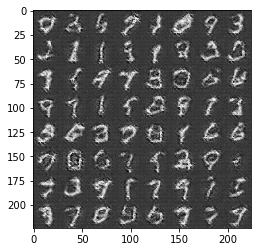

Epoch 2/2... Discriminator Loss: 0.0623... Generator Loss: 3.2341
Epoch 2/2... Discriminator Loss: 0.0249... Generator Loss: 4.2042
Epoch 2/2... Discriminator Loss: 0.0387... Generator Loss: 3.7926
Epoch 2/2... Discriminator Loss: 0.0665... Generator Loss: 3.3812
Epoch 2/2... Discriminator Loss: 6.3985... Generator Loss: 7.9843
Epoch 2/2... Discriminator Loss: 0.9646... Generator Loss: 1.2006
Epoch 2/2... Discriminator Loss: 0.8489... Generator Loss: 2.1819
Epoch 2/2... Discriminator Loss: 0.7121... Generator Loss: 1.0213
Epoch 2/2... Discriminator Loss: 0.7089... Generator Loss: 1.0353
Epoch 2/2... Discriminator Loss: 0.6088... Generator Loss: 1.9545


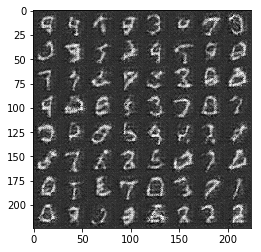

Epoch 2/2... Discriminator Loss: 0.7108... Generator Loss: 0.9507
Epoch 2/2... Discriminator Loss: 0.7579... Generator Loss: 2.2152
Epoch 2/2... Discriminator Loss: 0.7392... Generator Loss: 1.1547
Epoch 2/2... Discriminator Loss: 0.5708... Generator Loss: 1.8877
Epoch 2/2... Discriminator Loss: 0.4274... Generator Loss: 1.6447
Epoch 2/2... Discriminator Loss: 0.4562... Generator Loss: 1.6604
Epoch 2/2... Discriminator Loss: 0.5518... Generator Loss: 3.3629
Epoch 2/2... Discriminator Loss: 0.4145... Generator Loss: 1.8301
Epoch 2/2... Discriminator Loss: 0.3905... Generator Loss: 1.9555
Epoch 2/2... Discriminator Loss: 0.3817... Generator Loss: 2.4412


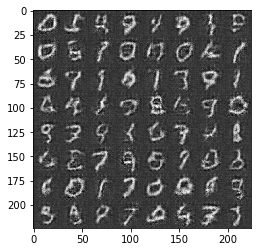

Epoch 2/2... Discriminator Loss: 0.5021... Generator Loss: 1.2324
Epoch 2/2... Discriminator Loss: 0.3027... Generator Loss: 3.3665
Epoch 2/2... Discriminator Loss: 0.5021... Generator Loss: 1.1498
Epoch 2/2... Discriminator Loss: 0.3618... Generator Loss: 1.5707
Epoch 2/2... Discriminator Loss: 0.5884... Generator Loss: 4.3069
Epoch 2/2... Discriminator Loss: 0.2965... Generator Loss: 1.9437
Epoch 2/2... Discriminator Loss: 0.2305... Generator Loss: 2.7146
Epoch 2/2... Discriminator Loss: 0.1606... Generator Loss: 2.9387
Epoch 2/2... Discriminator Loss: 0.3099... Generator Loss: 3.7903
Epoch 2/2... Discriminator Loss: 0.2222... Generator Loss: 2.8770


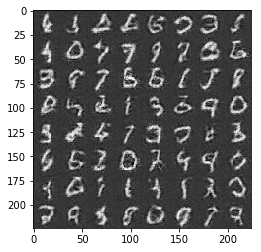

Epoch 2/2... Discriminator Loss: 0.1730... Generator Loss: 2.3081
Epoch 2/2... Discriminator Loss: 0.2135... Generator Loss: 2.0185
Epoch 2/2... Discriminator Loss: 0.2836... Generator Loss: 1.6908
Epoch 2/2... Discriminator Loss: 0.1698... Generator Loss: 2.9454
Epoch 2/2... Discriminator Loss: 0.2839... Generator Loss: 1.7270
Epoch 2/2... Discriminator Loss: 0.1455... Generator Loss: 2.3329
Epoch 2/2... Discriminator Loss: 0.1106... Generator Loss: 3.0538
Epoch 2/2... Discriminator Loss: 0.0931... Generator Loss: 3.4470
Epoch 2/2... Discriminator Loss: 0.0322... Generator Loss: 4.9584
Epoch 2/2... Discriminator Loss: 0.1498... Generator Loss: 2.3861


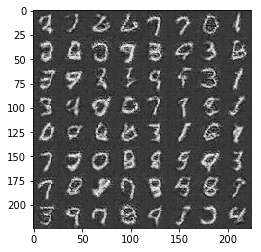

Epoch 2/2... Discriminator Loss: 0.0216... Generator Loss: 4.7637
Epoch 2/2... Discriminator Loss: 0.1553... Generator Loss: 2.2826
Epoch 2/2... Discriminator Loss: 0.0887... Generator Loss: 2.8640
Epoch 2/2... Discriminator Loss: 0.0671... Generator Loss: 3.1561
Epoch 2/2... Discriminator Loss: 0.0979... Generator Loss: 2.9557
Epoch 2/2... Discriminator Loss: 0.1206... Generator Loss: 2.5127
Epoch 2/2... Discriminator Loss: 0.0422... Generator Loss: 3.9200
Epoch 2/2... Discriminator Loss: 0.0512... Generator Loss: 3.4801
Epoch 2/2... Discriminator Loss: 0.0403... Generator Loss: 3.8021
Epoch 2/2... Discriminator Loss: 0.0118... Generator Loss: 6.2066


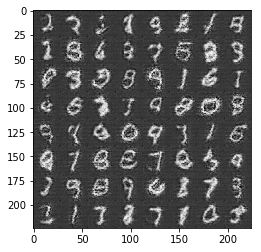

Epoch 2/2... Discriminator Loss: 0.1371... Generator Loss: 2.4937
Epoch 2/2... Discriminator Loss: 0.0322... Generator Loss: 4.0430
Epoch 2/2... Discriminator Loss: 0.0361... Generator Loss: 3.7787
Epoch 2/2... Discriminator Loss: 0.0135... Generator Loss: 5.9270
Epoch 2/2... Discriminator Loss: 0.0198... Generator Loss: 5.0835
Epoch 2/2... Discriminator Loss: 0.1919... Generator Loss: 2.0790
Epoch 2/2... Discriminator Loss: 0.0966... Generator Loss: 3.0392
Epoch 2/2... Discriminator Loss: 0.0478... Generator Loss: 3.4973
Epoch 2/2... Discriminator Loss: 0.0977... Generator Loss: 2.7897
Epoch 2/2... Discriminator Loss: 0.0192... Generator Loss: 5.1316


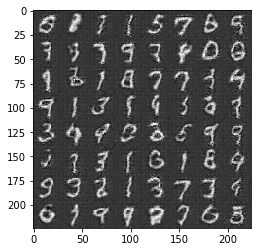

Epoch 2/2... Discriminator Loss: 0.0378... Generator Loss: 3.7520
Epoch 2/2... Discriminator Loss: 0.0226... Generator Loss: 4.5550
Epoch 2/2... Discriminator Loss: 2.0395... Generator Loss: 0.9271
Epoch 2/2... Discriminator Loss: 0.2635... Generator Loss: 1.9163
Epoch 2/2... Discriminator Loss: 0.1970... Generator Loss: 2.6902
Epoch 2/2... Discriminator Loss: 0.3908... Generator Loss: 1.3189
Epoch 2/2... Discriminator Loss: 0.1743... Generator Loss: 2.9158
Epoch 2/2... Discriminator Loss: 0.4414... Generator Loss: 1.3037
Epoch 2/2... Discriminator Loss: 0.0875... Generator Loss: 3.4158
Epoch 2/2... Discriminator Loss: 0.1775... Generator Loss: 2.3209


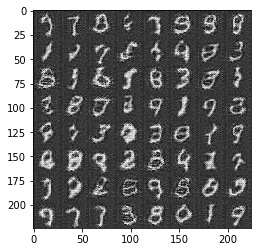

Epoch 2/2... Discriminator Loss: 0.1468... Generator Loss: 4.7007
Epoch 2/2... Discriminator Loss: 0.4633... Generator Loss: 1.3928
Epoch 2/2... Discriminator Loss: 0.4290... Generator Loss: 2.5434
Epoch 2/2... Discriminator Loss: 0.3785... Generator Loss: 1.7635
Epoch 2/2... Discriminator Loss: 0.2356... Generator Loss: 2.6581
Epoch 2/2... Discriminator Loss: 0.3025... Generator Loss: 1.6535
Epoch 2/2... Discriminator Loss: 0.1602... Generator Loss: 2.5605
Epoch 2/2... Discriminator Loss: 0.1999... Generator Loss: 2.0118
Epoch 2/2... Discriminator Loss: 0.1855... Generator Loss: 2.1285
Epoch 2/2... Discriminator Loss: 0.1138... Generator Loss: 2.6989


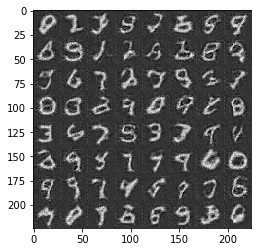

Epoch 2/2... Discriminator Loss: 0.1158... Generator Loss: 2.9413
Epoch 2/2... Discriminator Loss: 0.2316... Generator Loss: 1.8346
Epoch 2/2... Discriminator Loss: 0.0857... Generator Loss: 2.8519
Epoch 2/2... Discriminator Loss: 0.0806... Generator Loss: 2.9684
Epoch 2/2... Discriminator Loss: 0.1162... Generator Loss: 2.5911
Epoch 2/2... Discriminator Loss: 0.5981... Generator Loss: 1.0251
Epoch 2/2... Discriminator Loss: 0.2944... Generator Loss: 1.7212
Epoch 2/2... Discriminator Loss: 0.1256... Generator Loss: 2.7699
Epoch 2/2... Discriminator Loss: 0.2296... Generator Loss: 1.9585
Epoch 2/2... Discriminator Loss: 0.0258... Generator Loss: 4.5549


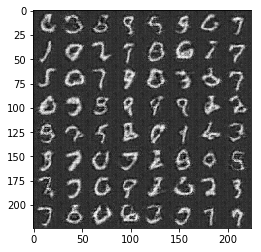

Epoch 2/2... Discriminator Loss: 0.1289... Generator Loss: 2.6089
Epoch 2/2... Discriminator Loss: 0.0933... Generator Loss: 2.8720
Epoch 2/2... Discriminator Loss: 0.0468... Generator Loss: 3.6211
Epoch 2/2... Discriminator Loss: 0.2578... Generator Loss: 1.9067
Epoch 2/2... Discriminator Loss: 0.0446... Generator Loss: 3.8394
Epoch 2/2... Discriminator Loss: 0.7658... Generator Loss: 0.8860
Epoch 2/2... Discriminator Loss: 0.2347... Generator Loss: 1.7271
Epoch 2/2... Discriminator Loss: 0.0780... Generator Loss: 3.0819
Epoch 2/2... Discriminator Loss: 0.0618... Generator Loss: 3.2545
Epoch 2/2... Discriminator Loss: 0.0348... Generator Loss: 4.0000


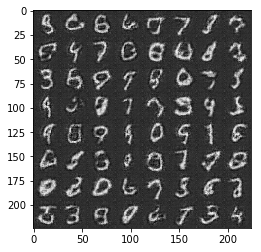

Epoch 2/2... Discriminator Loss: 0.0751... Generator Loss: 2.9638
Epoch 2/2... Discriminator Loss: 0.0339... Generator Loss: 5.1786
Epoch 2/2... Discriminator Loss: 0.0511... Generator Loss: 3.3899
Epoch 2/2... Discriminator Loss: 0.0476... Generator Loss: 4.0691
Epoch 2/2... Discriminator Loss: 0.0822... Generator Loss: 3.1587
Epoch 2/2... Discriminator Loss: 0.0663... Generator Loss: 3.1620
Epoch 2/2... Discriminator Loss: 3.4034... Generator Loss: 0.2520
Epoch 2/2... Discriminator Loss: 0.7101... Generator Loss: 1.5785
Epoch 2/2... Discriminator Loss: 0.7580... Generator Loss: 1.0682
Epoch 2/2... Discriminator Loss: 0.6782... Generator Loss: 1.7694


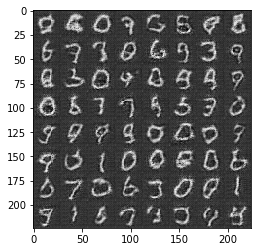

Epoch 2/2... Discriminator Loss: 0.6742... Generator Loss: 1.2891
Epoch 2/2... Discriminator Loss: 0.4944... Generator Loss: 2.1116
Epoch 2/2... Discriminator Loss: 0.6625... Generator Loss: 2.4823
Epoch 2/2... Discriminator Loss: 0.6173... Generator Loss: 1.2820
Epoch 2/2... Discriminator Loss: 0.4107... Generator Loss: 1.4631
Epoch 2/2... Discriminator Loss: 0.3231... Generator Loss: 2.5186
Epoch 2/2... Discriminator Loss: 0.5665... Generator Loss: 1.2690
Epoch 2/2... Discriminator Loss: 0.3841... Generator Loss: 2.8355
Epoch 2/2... Discriminator Loss: 0.4380... Generator Loss: 1.5589
Epoch 2/2... Discriminator Loss: 0.6045... Generator Loss: 1.0667


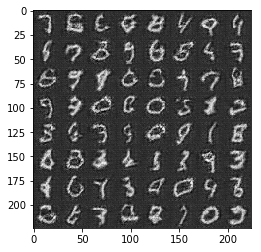

Epoch 2/2... Discriminator Loss: 0.5938... Generator Loss: 1.0856
Epoch 2/2... Discriminator Loss: 0.2541... Generator Loss: 1.9968
Epoch 2/2... Discriminator Loss: 0.2435... Generator Loss: 1.8201
Epoch 2/2... Discriminator Loss: 0.1860... Generator Loss: 2.1539
Epoch 2/2... Discriminator Loss: 0.0782... Generator Loss: 3.2222
Epoch 2/2... Discriminator Loss: 2.0529... Generator Loss: 0.2458
Epoch 2/2... Discriminator Loss: 0.8055... Generator Loss: 0.9193
Epoch 2/2... Discriminator Loss: 0.3688... Generator Loss: 2.2225
Epoch 2/2... Discriminator Loss: 0.4680... Generator Loss: 1.1892
Epoch 2/2... Discriminator Loss: 1.0208... Generator Loss: 0.7537


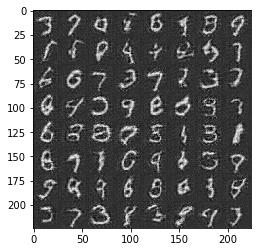

Epoch 2/2... Discriminator Loss: 0.2426... Generator Loss: 2.0586
Epoch 2/2... Discriminator Loss: 0.0958... Generator Loss: 2.8826
Epoch 2/2... Discriminator Loss: 0.0714... Generator Loss: 3.1420
Epoch 2/2... Discriminator Loss: 0.1943... Generator Loss: 2.1583
Epoch 2/2... Discriminator Loss: 0.0385... Generator Loss: 3.8013
Epoch 2/2... Discriminator Loss: 0.0453... Generator Loss: 3.6911
Epoch 2/2... Discriminator Loss: 0.0576... Generator Loss: 3.3141
Epoch 2/2... Discriminator Loss: 0.0229... Generator Loss: 4.7513
Epoch 2/2... Discriminator Loss: 0.0309... Generator Loss: 4.5951
Epoch 2/2... Discriminator Loss: 0.1441... Generator Loss: 2.4208


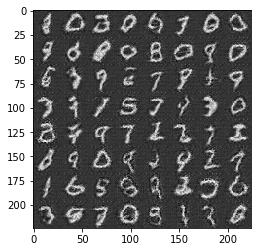

Epoch 2/2... Discriminator Loss: 0.3139... Generator Loss: 1.6641
Epoch 2/2... Discriminator Loss: 0.1093... Generator Loss: 2.8570
Epoch 2/2... Discriminator Loss: 0.1510... Generator Loss: 2.2129
Epoch 2/2... Discriminator Loss: 0.1020... Generator Loss: 2.9207
Epoch 2/2... Discriminator Loss: 0.0168... Generator Loss: 5.7432


In [12]:
batch_size = 32
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 2.7597... Generator Loss: 0.1037
Epoch 1/1... Discriminator Loss: 0.9187... Generator Loss: 0.7809
Epoch 1/1... Discriminator Loss: 0.6202... Generator Loss: 1.0212
Epoch 1/1... Discriminator Loss: 0.3899... Generator Loss: 1.7164
Epoch 1/1... Discriminator Loss: 0.4327... Generator Loss: 1.3269
Epoch 1/1... Discriminator Loss: 0.2918... Generator Loss: 1.9669
Epoch 1/1... Discriminator Loss: 0.2416... Generator Loss: 1.8881
Epoch 1/1... Discriminator Loss: 0.1303... Generator Loss: 4.4034
Epoch 1/1... Discriminator Loss: 0.3437... Generator Loss: 1.5347
Epoch 1/1... Discriminator Loss: 0.0897... Generator Loss: 3.0823


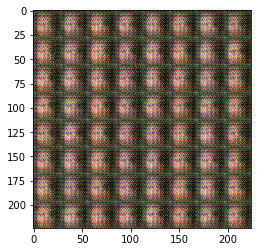

Epoch 1/1... Discriminator Loss: 0.1375... Generator Loss: 8.5274
Epoch 1/1... Discriminator Loss: 0.3220... Generator Loss: 2.2252
Epoch 1/1... Discriminator Loss: 0.2954... Generator Loss: 7.6305
Epoch 1/1... Discriminator Loss: 0.1509... Generator Loss: 5.3287
Epoch 1/1... Discriminator Loss: 0.1084... Generator Loss: 3.7508
Epoch 1/1... Discriminator Loss: 0.1549... Generator Loss: 2.5583
Epoch 1/1... Discriminator Loss: 0.1382... Generator Loss: 2.7550
Epoch 1/1... Discriminator Loss: 0.0531... Generator Loss: 3.7347
Epoch 1/1... Discriminator Loss: 0.0486... Generator Loss: 3.2782
Epoch 1/1... Discriminator Loss: 0.0970... Generator Loss: 2.8959


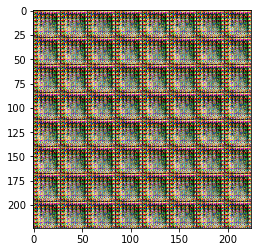

Epoch 1/1... Discriminator Loss: 0.0602... Generator Loss: 3.1265
Epoch 1/1... Discriminator Loss: 0.0398... Generator Loss: 3.4173
Epoch 1/1... Discriminator Loss: 0.0609... Generator Loss: 3.3010
Epoch 1/1... Discriminator Loss: 0.0469... Generator Loss: 3.5133
Epoch 1/1... Discriminator Loss: 0.1044... Generator Loss: 2.6874
Epoch 1/1... Discriminator Loss: 0.0489... Generator Loss: 4.2798
Epoch 1/1... Discriminator Loss: 0.0287... Generator Loss: 4.9007
Epoch 1/1... Discriminator Loss: 0.0443... Generator Loss: 3.7803
Epoch 1/1... Discriminator Loss: 0.0382... Generator Loss: 3.7191
Epoch 1/1... Discriminator Loss: 0.0476... Generator Loss: 4.5255


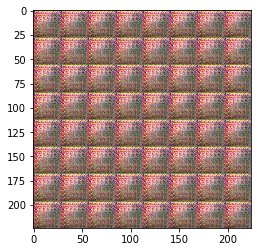

Epoch 1/1... Discriminator Loss: 0.1181... Generator Loss: 2.2479
Epoch 1/1... Discriminator Loss: 0.0238... Generator Loss: 3.8661
Epoch 1/1... Discriminator Loss: 0.0573... Generator Loss: 6.0497
Epoch 1/1... Discriminator Loss: 0.1439... Generator Loss: 2.1276
Epoch 1/1... Discriminator Loss: 0.3180... Generator Loss: 1.3549
Epoch 1/1... Discriminator Loss: 2.0222... Generator Loss: 0.1728
Epoch 1/1... Discriminator Loss: 0.1167... Generator Loss: 2.8887
Epoch 1/1... Discriminator Loss: 0.0915... Generator Loss: 10.4329
Epoch 1/1... Discriminator Loss: 0.5915... Generator Loss: 1.4941
Epoch 1/1... Discriminator Loss: 0.5746... Generator Loss: 0.9957


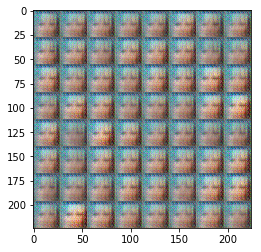

Epoch 1/1... Discriminator Loss: 0.2684... Generator Loss: 3.8907
Epoch 1/1... Discriminator Loss: 0.2000... Generator Loss: 5.2596
Epoch 1/1... Discriminator Loss: 2.5369... Generator Loss: 0.1117
Epoch 1/1... Discriminator Loss: 0.6524... Generator Loss: 0.9551
Epoch 1/1... Discriminator Loss: 0.6651... Generator Loss: 1.7271
Epoch 1/1... Discriminator Loss: 2.2081... Generator Loss: 0.1507
Epoch 1/1... Discriminator Loss: 0.5272... Generator Loss: 1.5388
Epoch 1/1... Discriminator Loss: 1.0351... Generator Loss: 0.5606
Epoch 1/1... Discriminator Loss: 0.8099... Generator Loss: 0.8668
Epoch 1/1... Discriminator Loss: 0.6253... Generator Loss: 1.6819


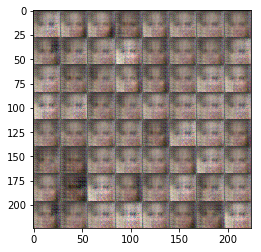

Epoch 1/1... Discriminator Loss: 0.6662... Generator Loss: 0.9462
Epoch 1/1... Discriminator Loss: 0.4441... Generator Loss: 1.8221
Epoch 1/1... Discriminator Loss: 0.4111... Generator Loss: 2.3876
Epoch 1/1... Discriminator Loss: 0.5364... Generator Loss: 1.4226
Epoch 1/1... Discriminator Loss: 0.4786... Generator Loss: 1.5743
Epoch 1/1... Discriminator Loss: 0.5190... Generator Loss: 1.5986
Epoch 1/1... Discriminator Loss: 0.8343... Generator Loss: 0.9828
Epoch 1/1... Discriminator Loss: 0.9366... Generator Loss: 1.4535
Epoch 1/1... Discriminator Loss: 0.6710... Generator Loss: 1.5725
Epoch 1/1... Discriminator Loss: 0.5959... Generator Loss: 2.2868


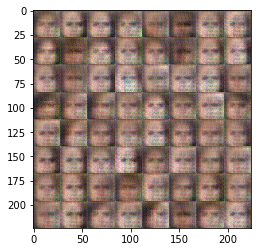

Epoch 1/1... Discriminator Loss: 0.6364... Generator Loss: 1.5349
Epoch 1/1... Discriminator Loss: 0.5564... Generator Loss: 1.6515
Epoch 1/1... Discriminator Loss: 0.8010... Generator Loss: 1.4460
Epoch 1/1... Discriminator Loss: 0.6631... Generator Loss: 1.5423
Epoch 1/1... Discriminator Loss: 0.7292... Generator Loss: 1.5061
Epoch 1/1... Discriminator Loss: 0.7044... Generator Loss: 1.7759
Epoch 1/1... Discriminator Loss: 0.6084... Generator Loss: 1.1969
Epoch 1/1... Discriminator Loss: 0.8906... Generator Loss: 1.0052
Epoch 1/1... Discriminator Loss: 0.7678... Generator Loss: 1.4761
Epoch 1/1... Discriminator Loss: 0.6880... Generator Loss: 2.1414


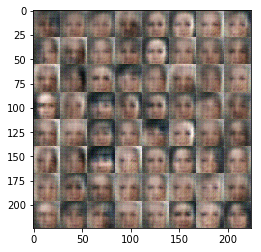

Epoch 1/1... Discriminator Loss: 0.7863... Generator Loss: 1.4265
Epoch 1/1... Discriminator Loss: 0.7841... Generator Loss: 1.0315
Epoch 1/1... Discriminator Loss: 0.6126... Generator Loss: 1.4481
Epoch 1/1... Discriminator Loss: 0.8234... Generator Loss: 1.0177
Epoch 1/1... Discriminator Loss: 0.8512... Generator Loss: 2.6464
Epoch 1/1... Discriminator Loss: 0.8589... Generator Loss: 1.1546
Epoch 1/1... Discriminator Loss: 0.9468... Generator Loss: 0.7577
Epoch 1/1... Discriminator Loss: 0.7123... Generator Loss: 1.4699
Epoch 1/1... Discriminator Loss: 0.5439... Generator Loss: 1.8505
Epoch 1/1... Discriminator Loss: 0.4502... Generator Loss: 2.4936


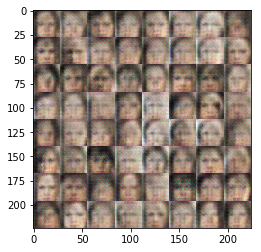

Epoch 1/1... Discriminator Loss: 0.5760... Generator Loss: 1.4997
Epoch 1/1... Discriminator Loss: 0.3850... Generator Loss: 2.7342
Epoch 1/1... Discriminator Loss: 1.0919... Generator Loss: 3.6013
Epoch 1/1... Discriminator Loss: 1.2296... Generator Loss: 4.3759
Epoch 1/1... Discriminator Loss: 2.0264... Generator Loss: 0.2697
Epoch 1/1... Discriminator Loss: 0.5074... Generator Loss: 2.1203
Epoch 1/1... Discriminator Loss: 0.4942... Generator Loss: 1.4620
Epoch 1/1... Discriminator Loss: 0.7642... Generator Loss: 0.9599
Epoch 1/1... Discriminator Loss: 0.3221... Generator Loss: 1.7383
Epoch 1/1... Discriminator Loss: 0.5034... Generator Loss: 1.4096


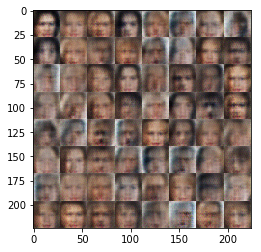

Epoch 1/1... Discriminator Loss: 0.2694... Generator Loss: 5.2457
Epoch 1/1... Discriminator Loss: 1.4831... Generator Loss: 0.3850
Epoch 1/1... Discriminator Loss: 0.8633... Generator Loss: 0.7883
Epoch 1/1... Discriminator Loss: 1.6649... Generator Loss: 0.2618
Epoch 1/1... Discriminator Loss: 1.0971... Generator Loss: 5.8745
Epoch 1/1... Discriminator Loss: 1.1171... Generator Loss: 4.2362
Epoch 1/1... Discriminator Loss: 0.7272... Generator Loss: 0.9064
Epoch 1/1... Discriminator Loss: 0.0831... Generator Loss: 3.3430
Epoch 1/1... Discriminator Loss: 0.2057... Generator Loss: 5.4554
Epoch 1/1... Discriminator Loss: 1.6947... Generator Loss: 0.2664


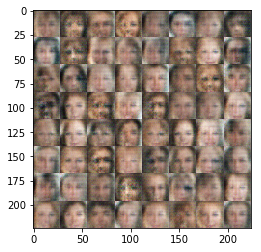

Epoch 1/1... Discriminator Loss: 1.1216... Generator Loss: 7.4786
Epoch 1/1... Discriminator Loss: 1.6570... Generator Loss: 5.2060
Epoch 1/1... Discriminator Loss: 1.9463... Generator Loss: 0.2300
Epoch 1/1... Discriminator Loss: 1.0257... Generator Loss: 0.6254
Epoch 1/1... Discriminator Loss: 0.6529... Generator Loss: 1.0409
Epoch 1/1... Discriminator Loss: 0.9247... Generator Loss: 4.5418
Epoch 1/1... Discriminator Loss: 1.0858... Generator Loss: 0.6383
Epoch 1/1... Discriminator Loss: 0.6507... Generator Loss: 3.5788
Epoch 1/1... Discriminator Loss: 0.6932... Generator Loss: 0.9512
Epoch 1/1... Discriminator Loss: 0.6087... Generator Loss: 1.1447


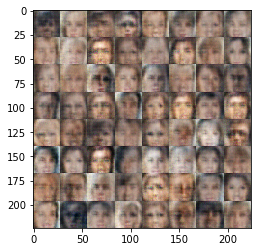

Epoch 1/1... Discriminator Loss: 2.0389... Generator Loss: 0.1956
Epoch 1/1... Discriminator Loss: 1.5261... Generator Loss: 0.3529
Epoch 1/1... Discriminator Loss: 0.1985... Generator Loss: 3.1934
Epoch 1/1... Discriminator Loss: 0.2019... Generator Loss: 3.3107
Epoch 1/1... Discriminator Loss: 0.5626... Generator Loss: 2.4766
Epoch 1/1... Discriminator Loss: 0.4320... Generator Loss: 1.6585
Epoch 1/1... Discriminator Loss: 0.4959... Generator Loss: 1.4300
Epoch 1/1... Discriminator Loss: 0.2430... Generator Loss: 2.7108
Epoch 1/1... Discriminator Loss: 0.6541... Generator Loss: 1.3562
Epoch 1/1... Discriminator Loss: 1.7853... Generator Loss: 0.2998


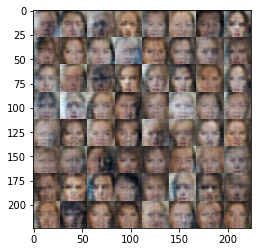

Epoch 1/1... Discriminator Loss: 1.9806... Generator Loss: 0.2562
Epoch 1/1... Discriminator Loss: 0.2071... Generator Loss: 2.6229
Epoch 1/1... Discriminator Loss: 2.1226... Generator Loss: 0.1842
Epoch 1/1... Discriminator Loss: 0.6545... Generator Loss: 3.2779
Epoch 1/1... Discriminator Loss: 0.4900... Generator Loss: 1.7924
Epoch 1/1... Discriminator Loss: 0.8408... Generator Loss: 1.0627
Epoch 1/1... Discriminator Loss: 1.9353... Generator Loss: 0.2048
Epoch 1/1... Discriminator Loss: 1.3460... Generator Loss: 0.4286
Epoch 1/1... Discriminator Loss: 0.3636... Generator Loss: 2.9033
Epoch 1/1... Discriminator Loss: 0.1242... Generator Loss: 3.7875


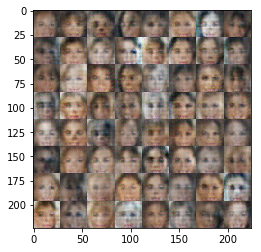

Epoch 1/1... Discriminator Loss: 0.7570... Generator Loss: 1.8044
Epoch 1/1... Discriminator Loss: 0.5446... Generator Loss: 1.7860
Epoch 1/1... Discriminator Loss: 0.9473... Generator Loss: 3.2871
Epoch 1/1... Discriminator Loss: 0.8652... Generator Loss: 1.1152
Epoch 1/1... Discriminator Loss: 0.9947... Generator Loss: 0.6509
Epoch 1/1... Discriminator Loss: 0.5765... Generator Loss: 1.1437
Epoch 1/1... Discriminator Loss: 1.2193... Generator Loss: 0.8701
Epoch 1/1... Discriminator Loss: 0.6243... Generator Loss: 1.5070
Epoch 1/1... Discriminator Loss: 1.1502... Generator Loss: 0.5474
Epoch 1/1... Discriminator Loss: 1.5333... Generator Loss: 0.3276


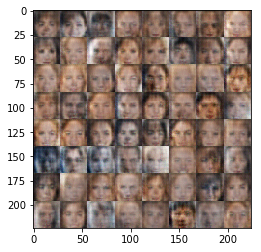

Epoch 1/1... Discriminator Loss: 0.3892... Generator Loss: 3.6732
Epoch 1/1... Discriminator Loss: 0.8221... Generator Loss: 2.1313
Epoch 1/1... Discriminator Loss: 0.3061... Generator Loss: 2.7244
Epoch 1/1... Discriminator Loss: 0.4760... Generator Loss: 1.4822
Epoch 1/1... Discriminator Loss: 1.8973... Generator Loss: 5.8644
Epoch 1/1... Discriminator Loss: 0.4572... Generator Loss: 1.4169
Epoch 1/1... Discriminator Loss: 0.2086... Generator Loss: 2.7353
Epoch 1/1... Discriminator Loss: 1.6147... Generator Loss: 4.6623
Epoch 1/1... Discriminator Loss: 0.7363... Generator Loss: 5.7043
Epoch 1/1... Discriminator Loss: 0.5932... Generator Loss: 1.2514


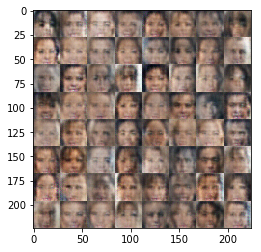

Epoch 1/1... Discriminator Loss: 0.8919... Generator Loss: 0.8863
Epoch 1/1... Discriminator Loss: 0.3891... Generator Loss: 3.8357
Epoch 1/1... Discriminator Loss: 0.9606... Generator Loss: 0.7476
Epoch 1/1... Discriminator Loss: 0.8512... Generator Loss: 2.1105
Epoch 1/1... Discriminator Loss: 0.5451... Generator Loss: 1.2723
Epoch 1/1... Discriminator Loss: 0.7703... Generator Loss: 0.8761
Epoch 1/1... Discriminator Loss: 0.6353... Generator Loss: 1.1016
Epoch 1/1... Discriminator Loss: 0.4922... Generator Loss: 1.3027
Epoch 1/1... Discriminator Loss: 0.4978... Generator Loss: 1.5185
Epoch 1/1... Discriminator Loss: 0.6889... Generator Loss: 1.7057


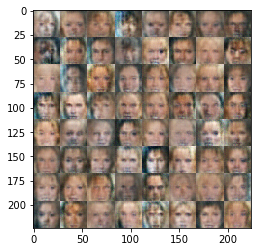

Epoch 1/1... Discriminator Loss: 0.3032... Generator Loss: 1.9864
Epoch 1/1... Discriminator Loss: 0.7831... Generator Loss: 0.9204
Epoch 1/1... Discriminator Loss: 0.2705... Generator Loss: 5.6923
Epoch 1/1... Discriminator Loss: 1.0004... Generator Loss: 0.6231
Epoch 1/1... Discriminator Loss: 1.1724... Generator Loss: 3.6558
Epoch 1/1... Discriminator Loss: 0.2759... Generator Loss: 2.8038
Epoch 1/1... Discriminator Loss: 1.2531... Generator Loss: 6.6185
Epoch 1/1... Discriminator Loss: 0.4274... Generator Loss: 1.5487
Epoch 1/1... Discriminator Loss: 1.0233... Generator Loss: 0.5317
Epoch 1/1... Discriminator Loss: 0.2320... Generator Loss: 4.5206


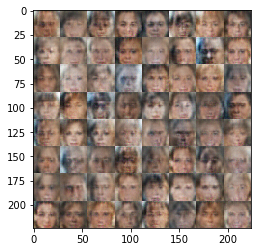

Epoch 1/1... Discriminator Loss: 0.5116... Generator Loss: 4.0304
Epoch 1/1... Discriminator Loss: 0.4166... Generator Loss: 1.6884
Epoch 1/1... Discriminator Loss: 0.1735... Generator Loss: 2.7454
Epoch 1/1... Discriminator Loss: 0.1157... Generator Loss: 5.0866
Epoch 1/1... Discriminator Loss: 0.7168... Generator Loss: 1.0043
Epoch 1/1... Discriminator Loss: 0.2912... Generator Loss: 4.9686
Epoch 1/1... Discriminator Loss: 0.3104... Generator Loss: 1.7884
Epoch 1/1... Discriminator Loss: 0.1725... Generator Loss: 2.6444
Epoch 1/1... Discriminator Loss: 0.1522... Generator Loss: 5.9984
Epoch 1/1... Discriminator Loss: 0.5201... Generator Loss: 1.2605


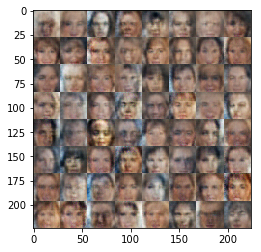

Epoch 1/1... Discriminator Loss: 0.5910... Generator Loss: 1.0112
Epoch 1/1... Discriminator Loss: 0.1876... Generator Loss: 3.0729
Epoch 1/1... Discriminator Loss: 0.5727... Generator Loss: 0.9862
Epoch 1/1... Discriminator Loss: 0.5729... Generator Loss: 1.1104
Epoch 1/1... Discriminator Loss: 0.0894... Generator Loss: 5.8226
Epoch 1/1... Discriminator Loss: 0.1879... Generator Loss: 2.8683
Epoch 1/1... Discriminator Loss: 0.0719... Generator Loss: 3.9866
Epoch 1/1... Discriminator Loss: 0.1701... Generator Loss: 7.5914
Epoch 1/1... Discriminator Loss: 0.3917... Generator Loss: 1.4454
Epoch 1/1... Discriminator Loss: 0.0822... Generator Loss: 4.2495


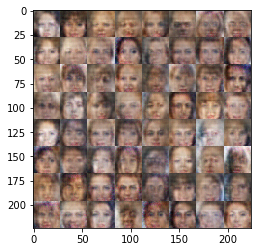

Epoch 1/1... Discriminator Loss: 0.7717... Generator Loss: 6.4288
Epoch 1/1... Discriminator Loss: 1.5939... Generator Loss: 0.4128
Epoch 1/1... Discriminator Loss: 0.2028... Generator Loss: 3.0618
Epoch 1/1... Discriminator Loss: 0.9613... Generator Loss: 6.6770
Epoch 1/1... Discriminator Loss: 0.2400... Generator Loss: 2.1088
Epoch 1/1... Discriminator Loss: 0.7127... Generator Loss: 3.0373
Epoch 1/1... Discriminator Loss: 0.0833... Generator Loss: 3.3496
Epoch 1/1... Discriminator Loss: 0.1505... Generator Loss: 4.7319
Epoch 1/1... Discriminator Loss: 0.0916... Generator Loss: 7.4954
Epoch 1/1... Discriminator Loss: 0.0489... Generator Loss: 4.4869


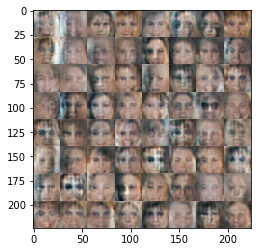

Epoch 1/1... Discriminator Loss: 0.1092... Generator Loss: 7.3175
Epoch 1/1... Discriminator Loss: 0.0198... Generator Loss: 7.7802
Epoch 1/1... Discriminator Loss: 0.0654... Generator Loss: 5.3238
Epoch 1/1... Discriminator Loss: 0.0885... Generator Loss: 8.5934
Epoch 1/1... Discriminator Loss: 0.0521... Generator Loss: 3.6960
Epoch 1/1... Discriminator Loss: 0.1369... Generator Loss: 3.1395
Epoch 1/1... Discriminator Loss: 0.0175... Generator Loss: 5.5153
Epoch 1/1... Discriminator Loss: 0.2240... Generator Loss: 4.1082
Epoch 1/1... Discriminator Loss: 0.0446... Generator Loss: 4.0641
Epoch 1/1... Discriminator Loss: 0.0438... Generator Loss: 7.3798


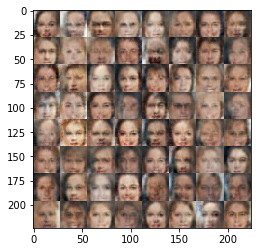

Epoch 1/1... Discriminator Loss: 0.1524... Generator Loss: 2.6891
Epoch 1/1... Discriminator Loss: 0.2354... Generator Loss: 5.5145
Epoch 1/1... Discriminator Loss: 1.1998... Generator Loss: 0.5200
Epoch 1/1... Discriminator Loss: 0.0614... Generator Loss: 3.5582
Epoch 1/1... Discriminator Loss: 0.1676... Generator Loss: 2.3386
Epoch 1/1... Discriminator Loss: 0.1773... Generator Loss: 2.2159
Epoch 1/1... Discriminator Loss: 0.3081... Generator Loss: 8.1634
Epoch 1/1... Discriminator Loss: 0.2588... Generator Loss: 1.8570
Epoch 1/1... Discriminator Loss: 0.0966... Generator Loss: 3.9557
Epoch 1/1... Discriminator Loss: 0.0310... Generator Loss: 6.0069


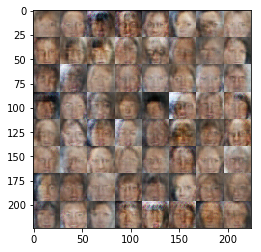

Epoch 1/1... Discriminator Loss: 0.0815... Generator Loss: 5.6199
Epoch 1/1... Discriminator Loss: 0.0778... Generator Loss: 3.5098
Epoch 1/1... Discriminator Loss: 0.0367... Generator Loss: 7.0812
Epoch 1/1... Discriminator Loss: 0.9125... Generator Loss: 0.7106
Epoch 1/1... Discriminator Loss: 0.0124... Generator Loss: 8.4210
Epoch 1/1... Discriminator Loss: 0.0277... Generator Loss: 5.9380
Epoch 1/1... Discriminator Loss: 0.0131... Generator Loss: 5.1849
Epoch 1/1... Discriminator Loss: 0.0209... Generator Loss: 6.3740
Epoch 1/1... Discriminator Loss: 0.0192... Generator Loss: 5.0128
Epoch 1/1... Discriminator Loss: 0.0114... Generator Loss: 7.6009


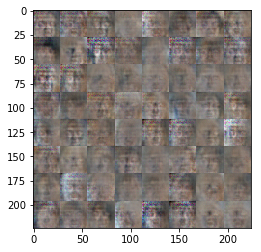

Epoch 1/1... Discriminator Loss: 0.0072... Generator Loss: 9.1859
Epoch 1/1... Discriminator Loss: 0.0056... Generator Loss: 7.1227
Epoch 1/1... Discriminator Loss: 0.0411... Generator Loss: 3.7336
Epoch 1/1... Discriminator Loss: 0.0090... Generator Loss: 6.6931
Epoch 1/1... Discriminator Loss: 0.0169... Generator Loss: 8.9245
Epoch 1/1... Discriminator Loss: 0.0360... Generator Loss: 4.0315
Epoch 1/1... Discriminator Loss: 0.0242... Generator Loss: 4.6449
Epoch 1/1... Discriminator Loss: 0.1867... Generator Loss: 2.2593
Epoch 1/1... Discriminator Loss: 0.0301... Generator Loss: 9.2145
Epoch 1/1... Discriminator Loss: 0.0062... Generator Loss: 6.1674


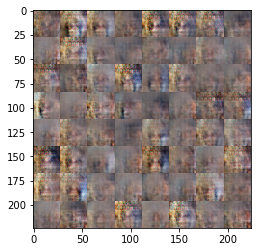

Epoch 1/1... Discriminator Loss: 0.0016... Generator Loss: 8.6596
Epoch 1/1... Discriminator Loss: 0.0189... Generator Loss: 4.4141
Epoch 1/1... Discriminator Loss: 0.0266... Generator Loss: 4.2401
Epoch 1/1... Discriminator Loss: 0.0308... Generator Loss: 6.6592
Epoch 1/1... Discriminator Loss: 0.0095... Generator Loss: 5.8303
Epoch 1/1... Discriminator Loss: 0.0765... Generator Loss: 5.2085
Epoch 1/1... Discriminator Loss: 0.2205... Generator Loss: 2.3945
Epoch 1/1... Discriminator Loss: 0.2121... Generator Loss: 4.5867
Epoch 1/1... Discriminator Loss: 0.0733... Generator Loss: 6.4271
Epoch 1/1... Discriminator Loss: 0.0314... Generator Loss: 9.1635


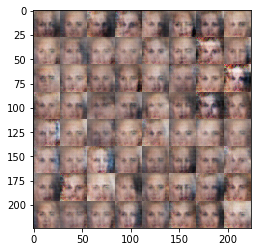

Epoch 1/1... Discriminator Loss: 0.0175... Generator Loss: 6.9714
Epoch 1/1... Discriminator Loss: 0.0251... Generator Loss: 5.5472
Epoch 1/1... Discriminator Loss: 0.0800... Generator Loss: 6.5601
Epoch 1/1... Discriminator Loss: 0.3505... Generator Loss: 7.6029
Epoch 1/1... Discriminator Loss: 0.0638... Generator Loss: 4.2523
Epoch 1/1... Discriminator Loss: 2.0624... Generator Loss: 7.2219
Epoch 1/1... Discriminator Loss: 0.5820... Generator Loss: 7.8298
Epoch 1/1... Discriminator Loss: 0.0955... Generator Loss: 6.0154
Epoch 1/1... Discriminator Loss: 0.0208... Generator Loss: 5.2602
Epoch 1/1... Discriminator Loss: 0.0380... Generator Loss: 6.4594


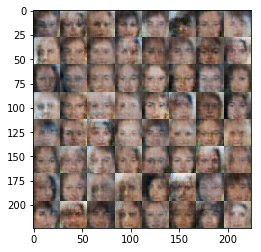

Epoch 1/1... Discriminator Loss: 0.0586... Generator Loss: 6.1756
Epoch 1/1... Discriminator Loss: 0.4894... Generator Loss: 1.6023
Epoch 1/1... Discriminator Loss: 0.0346... Generator Loss: 6.4143
Epoch 1/1... Discriminator Loss: 0.2383... Generator Loss: 3.7620
Epoch 1/1... Discriminator Loss: 0.2071... Generator Loss: 7.4039
Epoch 1/1... Discriminator Loss: 0.0240... Generator Loss: 5.5310
Epoch 1/1... Discriminator Loss: 0.0349... Generator Loss: 7.2999
Epoch 1/1... Discriminator Loss: 0.0693... Generator Loss: 5.6615
Epoch 1/1... Discriminator Loss: 0.0053... Generator Loss: 8.4379
Epoch 1/1... Discriminator Loss: 0.0118... Generator Loss: 7.4028


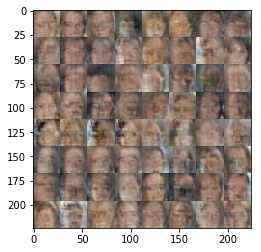

Epoch 1/1... Discriminator Loss: 0.0199... Generator Loss: 8.2875
Epoch 1/1... Discriminator Loss: 0.0182... Generator Loss: 6.7461
Epoch 1/1... Discriminator Loss: 0.0113... Generator Loss: 10.6431
Epoch 1/1... Discriminator Loss: 0.0121... Generator Loss: 11.8844
Epoch 1/1... Discriminator Loss: 0.0121... Generator Loss: 5.5071
Epoch 1/1... Discriminator Loss: 0.0148... Generator Loss: 8.2964
Epoch 1/1... Discriminator Loss: 0.0450... Generator Loss: 11.9898
Epoch 1/1... Discriminator Loss: 0.0181... Generator Loss: 11.2701
Epoch 1/1... Discriminator Loss: 0.1236... Generator Loss: 9.9791
Epoch 1/1... Discriminator Loss: 0.9731... Generator Loss: 10.0615


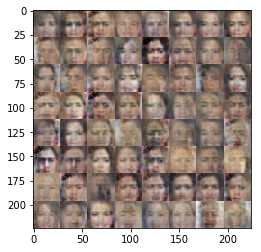

Epoch 1/1... Discriminator Loss: 1.9191... Generator Loss: 0.2583
Epoch 1/1... Discriminator Loss: 0.0309... Generator Loss: 6.3333
Epoch 1/1... Discriminator Loss: 0.1538... Generator Loss: 8.5922
Epoch 1/1... Discriminator Loss: 0.0378... Generator Loss: 6.4714
Epoch 1/1... Discriminator Loss: 0.0558... Generator Loss: 8.3911
Epoch 1/1... Discriminator Loss: 0.1204... Generator Loss: 4.0641
Epoch 1/1... Discriminator Loss: 0.0417... Generator Loss: 6.0832
Epoch 1/1... Discriminator Loss: 0.0569... Generator Loss: 6.4020
Epoch 1/1... Discriminator Loss: 0.1874... Generator Loss: 3.6677
Epoch 1/1... Discriminator Loss: 0.1085... Generator Loss: 3.0636


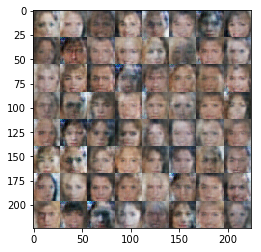

Epoch 1/1... Discriminator Loss: 0.2364... Generator Loss: 2.1598
Epoch 1/1... Discriminator Loss: 0.1062... Generator Loss: 3.0993
Epoch 1/1... Discriminator Loss: 0.0736... Generator Loss: 7.1949
Epoch 1/1... Discriminator Loss: 0.0428... Generator Loss: 5.3409
Epoch 1/1... Discriminator Loss: 0.1584... Generator Loss: 2.6096
Epoch 1/1... Discriminator Loss: 0.1023... Generator Loss: 3.2579
Epoch 1/1... Discriminator Loss: 0.0504... Generator Loss: 4.0956
Epoch 1/1... Discriminator Loss: 0.9492... Generator Loss: 7.1212
Epoch 1/1... Discriminator Loss: 0.5766... Generator Loss: 1.1446
Epoch 1/1... Discriminator Loss: 0.1722... Generator Loss: 2.5937


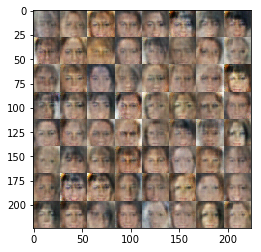

Epoch 1/1... Discriminator Loss: 0.0139... Generator Loss: 7.0127
Epoch 1/1... Discriminator Loss: 0.1299... Generator Loss: 2.9139
Epoch 1/1... Discriminator Loss: 0.0590... Generator Loss: 7.0111
Epoch 1/1... Discriminator Loss: 0.1028... Generator Loss: 2.9503
Epoch 1/1... Discriminator Loss: 0.0340... Generator Loss: 5.1916
Epoch 1/1... Discriminator Loss: 0.0948... Generator Loss: 3.5131
Epoch 1/1... Discriminator Loss: 0.0655... Generator Loss: 10.3294
Epoch 1/1... Discriminator Loss: 0.0195... Generator Loss: 6.5627
Epoch 1/1... Discriminator Loss: 0.0567... Generator Loss: 3.9250
Epoch 1/1... Discriminator Loss: 0.0952... Generator Loss: 3.2385


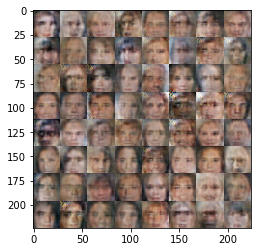

Epoch 1/1... Discriminator Loss: 0.0510... Generator Loss: 7.9890
Epoch 1/1... Discriminator Loss: 0.1458... Generator Loss: 2.4388
Epoch 1/1... Discriminator Loss: 3.1740... Generator Loss: 7.7012
Epoch 1/1... Discriminator Loss: 0.1910... Generator Loss: 2.4044
Epoch 1/1... Discriminator Loss: 0.0735... Generator Loss: 9.3281
Epoch 1/1... Discriminator Loss: 0.3094... Generator Loss: 1.8055
Epoch 1/1... Discriminator Loss: 0.0632... Generator Loss: 8.3602
Epoch 1/1... Discriminator Loss: 0.0182... Generator Loss: 7.1874
Epoch 1/1... Discriminator Loss: 0.1262... Generator Loss: 8.6445
Epoch 1/1... Discriminator Loss: 0.0833... Generator Loss: 7.1818


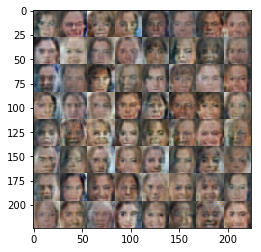

Epoch 1/1... Discriminator Loss: 0.4018... Generator Loss: 9.4282
Epoch 1/1... Discriminator Loss: 0.0188... Generator Loss: 5.3370
Epoch 1/1... Discriminator Loss: 0.0685... Generator Loss: 4.2775
Epoch 1/1... Discriminator Loss: 0.0703... Generator Loss: 3.2407
Epoch 1/1... Discriminator Loss: 0.0596... Generator Loss: 5.5434
Epoch 1/1... Discriminator Loss: 0.0274... Generator Loss: 4.7390
Epoch 1/1... Discriminator Loss: 0.0465... Generator Loss: 7.8719
Epoch 1/1... Discriminator Loss: 0.0148... Generator Loss: 7.5032
Epoch 1/1... Discriminator Loss: 0.0361... Generator Loss: 6.9757
Epoch 1/1... Discriminator Loss: 0.0247... Generator Loss: 9.4804


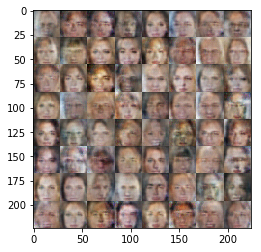

Epoch 1/1... Discriminator Loss: 0.0478... Generator Loss: 7.5833
Epoch 1/1... Discriminator Loss: 0.2969... Generator Loss: 8.3282
Epoch 1/1... Discriminator Loss: 0.1770... Generator Loss: 2.1139
Epoch 1/1... Discriminator Loss: 0.1308... Generator Loss: 2.6836
Epoch 1/1... Discriminator Loss: 0.0725... Generator Loss: 7.2651
Epoch 1/1... Discriminator Loss: 0.0738... Generator Loss: 11.8191
Epoch 1/1... Discriminator Loss: 0.0154... Generator Loss: 7.1761
Epoch 1/1... Discriminator Loss: 0.1872... Generator Loss: 7.5955
Epoch 1/1... Discriminator Loss: 0.1220... Generator Loss: 2.6729
Epoch 1/1... Discriminator Loss: 0.0297... Generator Loss: 6.6996


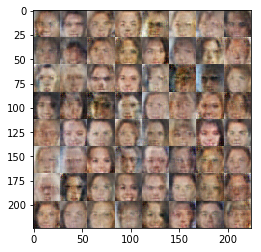

Epoch 1/1... Discriminator Loss: 1.5620... Generator Loss: 8.4128
Epoch 1/1... Discriminator Loss: 0.2559... Generator Loss: 2.4236
Epoch 1/1... Discriminator Loss: 0.0334... Generator Loss: 6.2882
Epoch 1/1... Discriminator Loss: 0.0558... Generator Loss: 3.5736
Epoch 1/1... Discriminator Loss: 0.1627... Generator Loss: 5.0933
Epoch 1/1... Discriminator Loss: 0.5401... Generator Loss: 1.2916
Epoch 1/1... Discriminator Loss: 0.0437... Generator Loss: 5.8448
Epoch 1/1... Discriminator Loss: 0.0837... Generator Loss: 4.3289
Epoch 1/1... Discriminator Loss: 0.0653... Generator Loss: 8.3631
Epoch 1/1... Discriminator Loss: 0.0254... Generator Loss: 11.8930


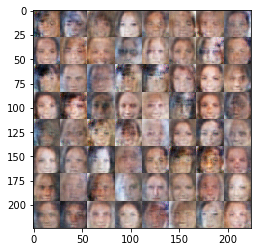

Epoch 1/1... Discriminator Loss: 0.1568... Generator Loss: 2.3299
Epoch 1/1... Discriminator Loss: 0.0217... Generator Loss: 8.7466
Epoch 1/1... Discriminator Loss: 0.2400... Generator Loss: 2.2002
Epoch 1/1... Discriminator Loss: 0.0184... Generator Loss: 8.2547
Epoch 1/1... Discriminator Loss: 0.0317... Generator Loss: 6.8982
Epoch 1/1... Discriminator Loss: 0.0375... Generator Loss: 4.7908
Epoch 1/1... Discriminator Loss: 0.0888... Generator Loss: 3.2569
Epoch 1/1... Discriminator Loss: 0.0383... Generator Loss: 3.9536
Epoch 1/1... Discriminator Loss: 2.0692... Generator Loss: 11.7706
Epoch 1/1... Discriminator Loss: 0.0502... Generator Loss: 7.3405


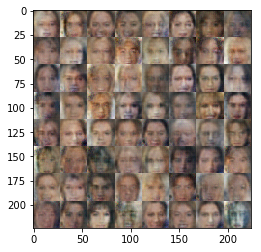

Epoch 1/1... Discriminator Loss: 0.0613... Generator Loss: 10.8447
Epoch 1/1... Discriminator Loss: 0.0259... Generator Loss: 4.6707
Epoch 1/1... Discriminator Loss: 0.0282... Generator Loss: 6.0403
Epoch 1/1... Discriminator Loss: 0.0259... Generator Loss: 5.3210
Epoch 1/1... Discriminator Loss: 0.0979... Generator Loss: 3.5506
Epoch 1/1... Discriminator Loss: 0.0188... Generator Loss: 6.7729
Epoch 1/1... Discriminator Loss: 0.0124... Generator Loss: 12.0716
Epoch 1/1... Discriminator Loss: 1.4461... Generator Loss: 0.5052
Epoch 1/1... Discriminator Loss: 0.0227... Generator Loss: 5.8886
Epoch 1/1... Discriminator Loss: 0.2197... Generator Loss: 2.0523


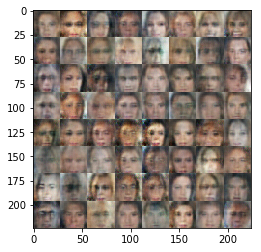

Epoch 1/1... Discriminator Loss: 0.0150... Generator Loss: 13.0447
Epoch 1/1... Discriminator Loss: 0.4118... Generator Loss: 1.8733
Epoch 1/1... Discriminator Loss: 0.0167... Generator Loss: 5.3404
Epoch 1/1... Discriminator Loss: 0.0356... Generator Loss: 4.6848
Epoch 1/1... Discriminator Loss: 0.0258... Generator Loss: 5.9340
Epoch 1/1... Discriminator Loss: 0.1954... Generator Loss: 2.3257
Epoch 1/1... Discriminator Loss: 0.1014... Generator Loss: 4.4414
Epoch 1/1... Discriminator Loss: 0.0292... Generator Loss: 5.0230
Epoch 1/1... Discriminator Loss: 0.0327... Generator Loss: 6.2582
Epoch 1/1... Discriminator Loss: 0.3980... Generator Loss: 1.6525


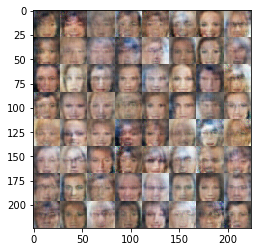

Epoch 1/1... Discriminator Loss: 0.1285... Generator Loss: 2.5098
Epoch 1/1... Discriminator Loss: 0.1919... Generator Loss: 2.0488
Epoch 1/1... Discriminator Loss: 0.0201... Generator Loss: 8.1329
Epoch 1/1... Discriminator Loss: 0.0097... Generator Loss: 10.4539
Epoch 1/1... Discriminator Loss: 0.0432... Generator Loss: 7.4915
Epoch 1/1... Discriminator Loss: 0.0227... Generator Loss: 5.7830
Epoch 1/1... Discriminator Loss: 0.0247... Generator Loss: 8.9792
Epoch 1/1... Discriminator Loss: 0.0598... Generator Loss: 3.4846
Epoch 1/1... Discriminator Loss: 0.0287... Generator Loss: 6.8853
Epoch 1/1... Discriminator Loss: 0.0022... Generator Loss: 9.7199


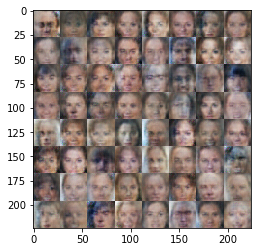

Epoch 1/1... Discriminator Loss: 0.0054... Generator Loss: 11.0664
Epoch 1/1... Discriminator Loss: 0.2574... Generator Loss: 1.9919
Epoch 1/1... Discriminator Loss: 0.0167... Generator Loss: 6.5240
Epoch 1/1... Discriminator Loss: 0.1027... Generator Loss: 3.0667
Epoch 1/1... Discriminator Loss: 0.0898... Generator Loss: 3.0139
Epoch 1/1... Discriminator Loss: 0.0284... Generator Loss: 4.9387
Epoch 1/1... Discriminator Loss: 0.0209... Generator Loss: 12.3608
Epoch 1/1... Discriminator Loss: 0.0203... Generator Loss: 6.8348
Epoch 1/1... Discriminator Loss: 0.1440... Generator Loss: 2.7421
Epoch 1/1... Discriminator Loss: 0.0348... Generator Loss: 4.8835


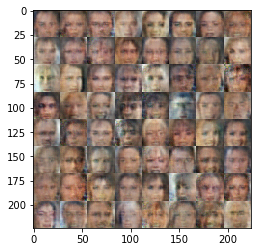

Epoch 1/1... Discriminator Loss: 0.0367... Generator Loss: 6.9450
Epoch 1/1... Discriminator Loss: 0.1368... Generator Loss: 2.8455
Epoch 1/1... Discriminator Loss: 0.0076... Generator Loss: 6.8340
Epoch 1/1... Discriminator Loss: 0.0402... Generator Loss: 3.6482
Epoch 1/1... Discriminator Loss: 0.0728... Generator Loss: 8.8268
Epoch 1/1... Discriminator Loss: 0.0047... Generator Loss: 12.4063
Epoch 1/1... Discriminator Loss: 0.0182... Generator Loss: 9.9504
Epoch 1/1... Discriminator Loss: 0.0128... Generator Loss: 7.2076
Epoch 1/1... Discriminator Loss: 0.0198... Generator Loss: 8.3009
Epoch 1/1... Discriminator Loss: 0.2429... Generator Loss: 1.9661


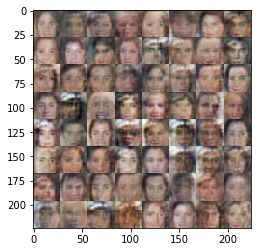

Epoch 1/1... Discriminator Loss: 0.0055... Generator Loss: 6.3818
Epoch 1/1... Discriminator Loss: 0.9467... Generator Loss: 1.0901
Epoch 1/1... Discriminator Loss: 0.5795... Generator Loss: 1.3310
Epoch 1/1... Discriminator Loss: 2.1208... Generator Loss: 0.1914
Epoch 1/1... Discriminator Loss: 0.0692... Generator Loss: 5.6362
Epoch 1/1... Discriminator Loss: 0.0598... Generator Loss: 7.7018
Epoch 1/1... Discriminator Loss: 0.5978... Generator Loss: 1.1752
Epoch 1/1... Discriminator Loss: 0.0412... Generator Loss: 6.4013
Epoch 1/1... Discriminator Loss: 0.0497... Generator Loss: 4.2541
Epoch 1/1... Discriminator Loss: 0.0319... Generator Loss: 7.5281


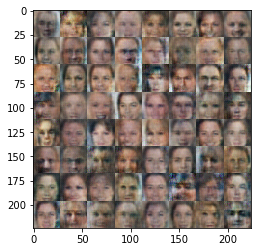

Epoch 1/1... Discriminator Loss: 0.1589... Generator Loss: 2.4061
Epoch 1/1... Discriminator Loss: 0.0229... Generator Loss: 6.0620
Epoch 1/1... Discriminator Loss: 0.1185... Generator Loss: 2.7035
Epoch 1/1... Discriminator Loss: 0.0487... Generator Loss: 9.1101
Epoch 1/1... Discriminator Loss: 0.0220... Generator Loss: 5.3283
Epoch 1/1... Discriminator Loss: 0.1347... Generator Loss: 2.6668
Epoch 1/1... Discriminator Loss: 0.1925... Generator Loss: 2.1451
Epoch 1/1... Discriminator Loss: 0.1412... Generator Loss: 9.6617
Epoch 1/1... Discriminator Loss: 0.0206... Generator Loss: 13.2368
Epoch 1/1... Discriminator Loss: 0.0338... Generator Loss: 4.1221


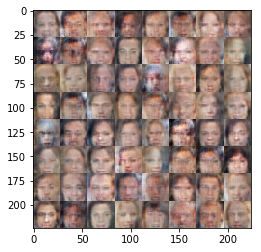

Epoch 1/1... Discriminator Loss: 0.0823... Generator Loss: 3.1504
Epoch 1/1... Discriminator Loss: 0.0125... Generator Loss: 6.2965
Epoch 1/1... Discriminator Loss: 0.0399... Generator Loss: 4.2659
Epoch 1/1... Discriminator Loss: 0.2279... Generator Loss: 1.9934
Epoch 1/1... Discriminator Loss: 0.0541... Generator Loss: 3.9147
Epoch 1/1... Discriminator Loss: 0.3102... Generator Loss: 4.9980
Epoch 1/1... Discriminator Loss: 0.0446... Generator Loss: 4.6547
Epoch 1/1... Discriminator Loss: 1.8891... Generator Loss: 1.0827
Epoch 1/1... Discriminator Loss: 0.4159... Generator Loss: 2.4899
Epoch 1/1... Discriminator Loss: 1.6237... Generator Loss: 0.3371


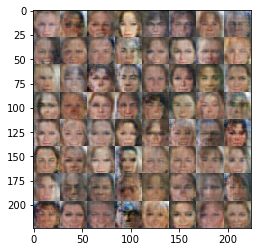

Epoch 1/1... Discriminator Loss: 0.1407... Generator Loss: 8.6613
Epoch 1/1... Discriminator Loss: 0.1524... Generator Loss: 3.2030
Epoch 1/1... Discriminator Loss: 0.0583... Generator Loss: 5.1492
Epoch 1/1... Discriminator Loss: 0.2544... Generator Loss: 2.0062
Epoch 1/1... Discriminator Loss: 0.0491... Generator Loss: 5.2184
Epoch 1/1... Discriminator Loss: 0.0352... Generator Loss: 7.9369
Epoch 1/1... Discriminator Loss: 0.0378... Generator Loss: 4.4952
Epoch 1/1... Discriminator Loss: 0.0575... Generator Loss: 5.0616
Epoch 1/1... Discriminator Loss: 0.0555... Generator Loss: 3.5217
Epoch 1/1... Discriminator Loss: 0.1563... Generator Loss: 2.3849


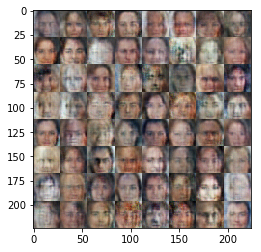

Epoch 1/1... Discriminator Loss: 0.0042... Generator Loss: 9.1997
Epoch 1/1... Discriminator Loss: 0.0567... Generator Loss: 6.0753
Epoch 1/1... Discriminator Loss: 0.0734... Generator Loss: 12.3527
Epoch 1/1... Discriminator Loss: 0.0338... Generator Loss: 7.5917
Epoch 1/1... Discriminator Loss: 0.0216... Generator Loss: 8.5526
Epoch 1/1... Discriminator Loss: 0.0411... Generator Loss: 9.8933
Epoch 1/1... Discriminator Loss: 0.0216... Generator Loss: 4.8561
Epoch 1/1... Discriminator Loss: 0.0157... Generator Loss: 7.3765
Epoch 1/1... Discriminator Loss: 0.3982... Generator Loss: 2.2102
Epoch 1/1... Discriminator Loss: 0.0466... Generator Loss: 7.8681


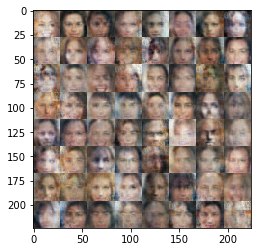

Epoch 1/1... Discriminator Loss: 0.0309... Generator Loss: 7.3686
Epoch 1/1... Discriminator Loss: 0.0090... Generator Loss: 10.5412
Epoch 1/1... Discriminator Loss: 0.0395... Generator Loss: 12.1300
Epoch 1/1... Discriminator Loss: 0.0385... Generator Loss: 8.1961
Epoch 1/1... Discriminator Loss: 0.0363... Generator Loss: 7.4368
Epoch 1/1... Discriminator Loss: 0.1663... Generator Loss: 8.2099
Epoch 1/1... Discriminator Loss: 0.0279... Generator Loss: 5.4575
Epoch 1/1... Discriminator Loss: 0.0195... Generator Loss: 5.0620
Epoch 1/1... Discriminator Loss: 0.0336... Generator Loss: 11.3639
Epoch 1/1... Discriminator Loss: 0.0116... Generator Loss: 6.5680


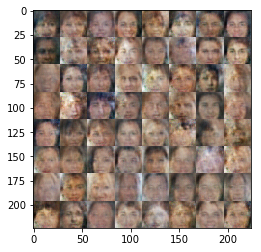

Epoch 1/1... Discriminator Loss: 0.1439... Generator Loss: 3.0075
Epoch 1/1... Discriminator Loss: 0.1166... Generator Loss: 3.2112
Epoch 1/1... Discriminator Loss: 1.0094... Generator Loss: 14.8159
Epoch 1/1... Discriminator Loss: 0.0076... Generator Loss: 12.0236
Epoch 1/1... Discriminator Loss: 0.0243... Generator Loss: 6.7101
Epoch 1/1... Discriminator Loss: 0.0766... Generator Loss: 3.5752
Epoch 1/1... Discriminator Loss: 0.0651... Generator Loss: 4.4294
Epoch 1/1... Discriminator Loss: 0.0698... Generator Loss: 4.7500
Epoch 1/1... Discriminator Loss: 0.0261... Generator Loss: 5.1299
Epoch 1/1... Discriminator Loss: 0.2690... Generator Loss: 1.7986


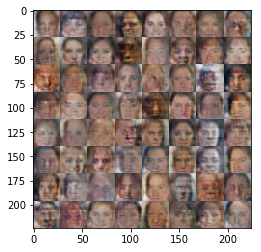

Epoch 1/1... Discriminator Loss: 0.1455... Generator Loss: 2.6435
Epoch 1/1... Discriminator Loss: 0.1116... Generator Loss: 5.7604
Epoch 1/1... Discriminator Loss: 0.0933... Generator Loss: 11.3848
Epoch 1/1... Discriminator Loss: 0.0350... Generator Loss: 5.0276
Epoch 1/1... Discriminator Loss: 0.0327... Generator Loss: 12.1955
Epoch 1/1... Discriminator Loss: 1.6535... Generator Loss: 0.4289
Epoch 1/1... Discriminator Loss: 0.0523... Generator Loss: 3.8745
Epoch 1/1... Discriminator Loss: 0.1160... Generator Loss: 3.6765
Epoch 1/1... Discriminator Loss: 0.0388... Generator Loss: 5.6355
Epoch 1/1... Discriminator Loss: 0.0362... Generator Loss: 7.8618


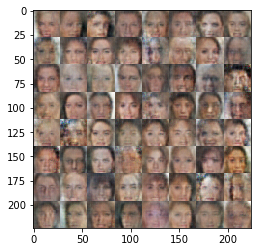

Epoch 1/1... Discriminator Loss: 0.0238... Generator Loss: 10.6292
Epoch 1/1... Discriminator Loss: 0.0237... Generator Loss: 7.7500
Epoch 1/1... Discriminator Loss: 0.0269... Generator Loss: 8.2556
Epoch 1/1... Discriminator Loss: 0.0287... Generator Loss: 6.5599
Epoch 1/1... Discriminator Loss: 0.0180... Generator Loss: 7.3258
Epoch 1/1... Discriminator Loss: 0.0566... Generator Loss: 4.2590
Epoch 1/1... Discriminator Loss: 0.0285... Generator Loss: 6.1332
Epoch 1/1... Discriminator Loss: 0.0321... Generator Loss: 4.7746
Epoch 1/1... Discriminator Loss: 0.0416... Generator Loss: 8.9553
Epoch 1/1... Discriminator Loss: 0.0245... Generator Loss: 7.2781


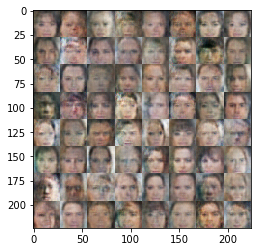

Epoch 1/1... Discriminator Loss: 0.0404... Generator Loss: 4.4369
Epoch 1/1... Discriminator Loss: 0.4631... Generator Loss: 1.3488
Epoch 1/1... Discriminator Loss: 0.0252... Generator Loss: 10.0240
Epoch 1/1... Discriminator Loss: 0.0186... Generator Loss: 6.0001
Epoch 1/1... Discriminator Loss: 0.0105... Generator Loss: 7.9067
Epoch 1/1... Discriminator Loss: 0.0941... Generator Loss: 3.0946
Epoch 1/1... Discriminator Loss: 0.0126... Generator Loss: 8.1556
Epoch 1/1... Discriminator Loss: 0.0184... Generator Loss: 7.9883
Epoch 1/1... Discriminator Loss: 1.9776... Generator Loss: 0.3609
Epoch 1/1... Discriminator Loss: 0.3231... Generator Loss: 1.8451


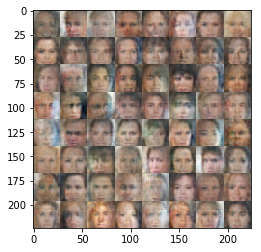

Epoch 1/1... Discriminator Loss: 1.7487... Generator Loss: 6.7264
Epoch 1/1... Discriminator Loss: 0.3287... Generator Loss: 3.9497
Epoch 1/1... Discriminator Loss: 0.0938... Generator Loss: 2.9159
Epoch 1/1... Discriminator Loss: 0.2395... Generator Loss: 10.8754
Epoch 1/1... Discriminator Loss: 0.0329... Generator Loss: 4.7826
Epoch 1/1... Discriminator Loss: 0.0300... Generator Loss: 7.2700
Epoch 1/1... Discriminator Loss: 0.0483... Generator Loss: 5.7845
Epoch 1/1... Discriminator Loss: 0.0386... Generator Loss: 4.6691
Epoch 1/1... Discriminator Loss: 0.0258... Generator Loss: 8.4591
Epoch 1/1... Discriminator Loss: 0.0315... Generator Loss: 5.3728


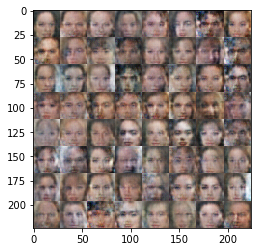

Epoch 1/1... Discriminator Loss: 0.0098... Generator Loss: 7.8190
Epoch 1/1... Discriminator Loss: 0.1161... Generator Loss: 8.8310
Epoch 1/1... Discriminator Loss: 0.0270... Generator Loss: 9.1057
Epoch 1/1... Discriminator Loss: 0.3372... Generator Loss: 1.9234
Epoch 1/1... Discriminator Loss: 0.0255... Generator Loss: 8.4929
Epoch 1/1... Discriminator Loss: 0.0234... Generator Loss: 8.9463
Epoch 1/1... Discriminator Loss: 0.0554... Generator Loss: 8.4311
Epoch 1/1... Discriminator Loss: 0.0884... Generator Loss: 10.8720
Epoch 1/1... Discriminator Loss: 0.6066... Generator Loss: 1.1368
Epoch 1/1... Discriminator Loss: 0.0104... Generator Loss: 7.7192


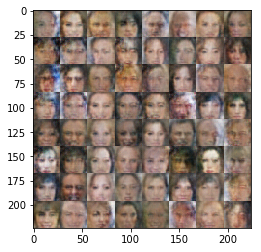

Epoch 1/1... Discriminator Loss: 0.0431... Generator Loss: 5.1783
Epoch 1/1... Discriminator Loss: 0.0987... Generator Loss: 2.9922
Epoch 1/1... Discriminator Loss: 0.3627... Generator Loss: 1.3976
Epoch 1/1... Discriminator Loss: 0.0232... Generator Loss: 4.9487
Epoch 1/1... Discriminator Loss: 0.8175... Generator Loss: 0.9007
Epoch 1/1... Discriminator Loss: 0.0500... Generator Loss: 4.2569
Epoch 1/1... Discriminator Loss: 0.0112... Generator Loss: 11.8805
Epoch 1/1... Discriminator Loss: 0.1206... Generator Loss: 2.6043
Epoch 1/1... Discriminator Loss: 0.0240... Generator Loss: 9.1704
Epoch 1/1... Discriminator Loss: 0.4836... Generator Loss: 1.1917


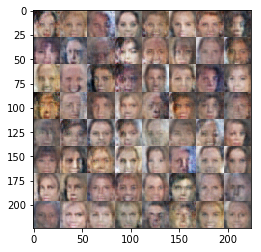

Epoch 1/1... Discriminator Loss: 0.0102... Generator Loss: 8.1560
Epoch 1/1... Discriminator Loss: 1.5085... Generator Loss: 0.4782
Epoch 1/1... Discriminator Loss: 0.0108... Generator Loss: 7.0633
Epoch 1/1... Discriminator Loss: 0.0251... Generator Loss: 7.9140
Epoch 1/1... Discriminator Loss: 1.3052... Generator Loss: 0.6659
Epoch 1/1... Discriminator Loss: 0.2000... Generator Loss: 5.2452
Epoch 1/1... Discriminator Loss: 0.0304... Generator Loss: 4.7798
Epoch 1/1... Discriminator Loss: 0.0292... Generator Loss: 5.4929
Epoch 1/1... Discriminator Loss: 2.5127... Generator Loss: 5.9120
Epoch 1/1... Discriminator Loss: 1.2385... Generator Loss: 0.4311


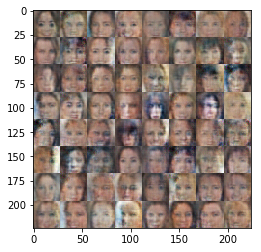

Epoch 1/1... Discriminator Loss: 1.2979... Generator Loss: 0.5553
Epoch 1/1... Discriminator Loss: 1.5855... Generator Loss: 0.4074
Epoch 1/1... Discriminator Loss: 0.0380... Generator Loss: 5.9857
Epoch 1/1... Discriminator Loss: 0.8168... Generator Loss: 0.7728
Epoch 1/1... Discriminator Loss: 0.9430... Generator Loss: 0.6709
Epoch 1/1... Discriminator Loss: 0.1248... Generator Loss: 6.2998
Epoch 1/1... Discriminator Loss: 0.0450... Generator Loss: 6.7677
Epoch 1/1... Discriminator Loss: 0.2182... Generator Loss: 2.1864
Epoch 1/1... Discriminator Loss: 1.5254... Generator Loss: 0.4306
Epoch 1/1... Discriminator Loss: 0.0589... Generator Loss: 4.7696


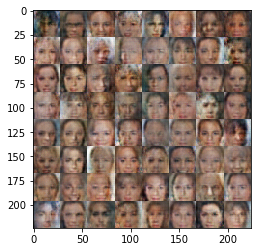

Epoch 1/1... Discriminator Loss: 0.1045... Generator Loss: 5.5751
Epoch 1/1... Discriminator Loss: 0.0490... Generator Loss: 5.5041
Epoch 1/1... Discriminator Loss: 0.0368... Generator Loss: 9.2790
Epoch 1/1... Discriminator Loss: 0.1593... Generator Loss: 2.4245
Epoch 1/1... Discriminator Loss: 0.0171... Generator Loss: 7.7963
Epoch 1/1... Discriminator Loss: 0.0435... Generator Loss: 3.9036
Epoch 1/1... Discriminator Loss: 0.0654... Generator Loss: 3.8268
Epoch 1/1... Discriminator Loss: 0.0413... Generator Loss: 6.0563
Epoch 1/1... Discriminator Loss: 0.0500... Generator Loss: 4.0240
Epoch 1/1... Discriminator Loss: 0.2875... Generator Loss: 1.7959


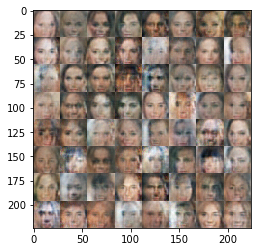

Epoch 1/1... Discriminator Loss: 0.2296... Generator Loss: 1.8758
Epoch 1/1... Discriminator Loss: 0.2275... Generator Loss: 2.1514
Epoch 1/1... Discriminator Loss: 0.0886... Generator Loss: 3.7185
Epoch 1/1... Discriminator Loss: 0.0173... Generator Loss: 5.7204
Epoch 1/1... Discriminator Loss: 0.0546... Generator Loss: 4.0297
Epoch 1/1... Discriminator Loss: 0.0143... Generator Loss: 8.9283
Epoch 1/1... Discriminator Loss: 0.0479... Generator Loss: 6.0341
Epoch 1/1... Discriminator Loss: 0.1352... Generator Loss: 3.9651
Epoch 1/1... Discriminator Loss: 0.0490... Generator Loss: 4.2885
Epoch 1/1... Discriminator Loss: 0.0261... Generator Loss: 5.5169


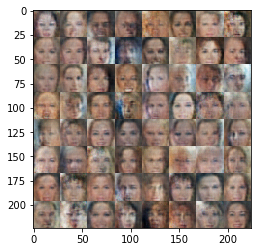

Epoch 1/1... Discriminator Loss: 0.0875... Generator Loss: 2.8703
Epoch 1/1... Discriminator Loss: 0.0530... Generator Loss: 8.2793
Epoch 1/1... Discriminator Loss: 0.0684... Generator Loss: 3.7354
Epoch 1/1... Discriminator Loss: 0.2149... Generator Loss: 2.4057
Epoch 1/1... Discriminator Loss: 1.5870... Generator Loss: 0.3686
Epoch 1/1... Discriminator Loss: 0.0879... Generator Loss: 10.0096
Epoch 1/1... Discriminator Loss: 0.0121... Generator Loss: 5.6185
Epoch 1/1... Discriminator Loss: 0.0405... Generator Loss: 5.2393
Epoch 1/1... Discriminator Loss: 0.4584... Generator Loss: 9.3842
Epoch 1/1... Discriminator Loss: 0.0110... Generator Loss: 8.3041


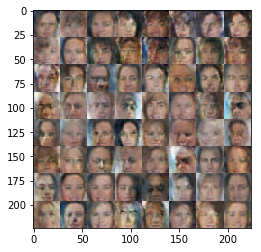

Epoch 1/1... Discriminator Loss: 0.0611... Generator Loss: 3.9342
Epoch 1/1... Discriminator Loss: 0.0268... Generator Loss: 5.2139
Epoch 1/1... Discriminator Loss: 0.0771... Generator Loss: 3.4816
Epoch 1/1... Discriminator Loss: 0.0155... Generator Loss: 8.2918
Epoch 1/1... Discriminator Loss: 0.0202... Generator Loss: 6.5354
Epoch 1/1... Discriminator Loss: 0.0346... Generator Loss: 5.2857
Epoch 1/1... Discriminator Loss: 0.9519... Generator Loss: 0.8621
Epoch 1/1... Discriminator Loss: 0.1004... Generator Loss: 4.9421
Epoch 1/1... Discriminator Loss: 0.1975... Generator Loss: 7.4286
Epoch 1/1... Discriminator Loss: 0.1950... Generator Loss: 2.7079


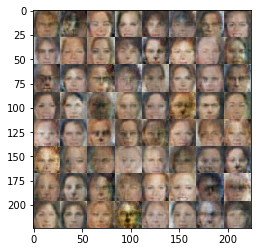

Epoch 1/1... Discriminator Loss: 0.4353... Generator Loss: 1.4667
Epoch 1/1... Discriminator Loss: 0.1828... Generator Loss: 2.7163
Epoch 1/1... Discriminator Loss: 0.0666... Generator Loss: 6.1087
Epoch 1/1... Discriminator Loss: 0.0381... Generator Loss: 4.0299
Epoch 1/1... Discriminator Loss: 0.1481... Generator Loss: 2.7696
Epoch 1/1... Discriminator Loss: 0.2204... Generator Loss: 2.0868
Epoch 1/1... Discriminator Loss: 0.3636... Generator Loss: 1.4792
Epoch 1/1... Discriminator Loss: 0.0332... Generator Loss: 7.2077
Epoch 1/1... Discriminator Loss: 0.1269... Generator Loss: 2.8933
Epoch 1/1... Discriminator Loss: 0.0312... Generator Loss: 11.2007


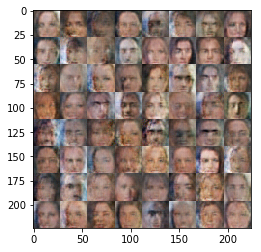

Epoch 1/1... Discriminator Loss: 0.1975... Generator Loss: 2.3404
Epoch 1/1... Discriminator Loss: 0.0218... Generator Loss: 6.1937
Epoch 1/1... Discriminator Loss: 0.0249... Generator Loss: 9.4206
Epoch 1/1... Discriminator Loss: 0.0231... Generator Loss: 5.8361
Epoch 1/1... Discriminator Loss: 0.3292... Generator Loss: 2.0387
Epoch 1/1... Discriminator Loss: 0.0082... Generator Loss: 8.9556
Epoch 1/1... Discriminator Loss: 0.2888... Generator Loss: 2.1188
Epoch 1/1... Discriminator Loss: 0.1482... Generator Loss: 2.5849
Epoch 1/1... Discriminator Loss: 0.0819... Generator Loss: 6.0922
Epoch 1/1... Discriminator Loss: 0.0301... Generator Loss: 6.5021


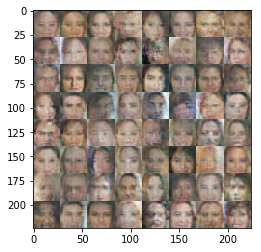

Epoch 1/1... Discriminator Loss: 0.0735... Generator Loss: 3.8823
Epoch 1/1... Discriminator Loss: 0.0181... Generator Loss: 9.0170
Epoch 1/1... Discriminator Loss: 0.0312... Generator Loss: 6.5452
Epoch 1/1... Discriminator Loss: 1.1430... Generator Loss: 10.4544
Epoch 1/1... Discriminator Loss: 0.0230... Generator Loss: 6.1814
Epoch 1/1... Discriminator Loss: 0.0217... Generator Loss: 12.4044
Epoch 1/1... Discriminator Loss: 0.0132... Generator Loss: 8.9381
Epoch 1/1... Discriminator Loss: 0.6350... Generator Loss: 1.1211
Epoch 1/1... Discriminator Loss: 0.0313... Generator Loss: 9.0946
Epoch 1/1... Discriminator Loss: 0.1103... Generator Loss: 8.1355


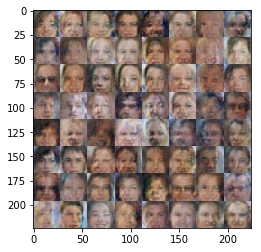

Epoch 1/1... Discriminator Loss: 0.0103... Generator Loss: 9.0949
Epoch 1/1... Discriminator Loss: 0.0188... Generator Loss: 7.3157
Epoch 1/1... Discriminator Loss: 0.0159... Generator Loss: 6.8139


In [13]:
batch_size = 32
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.